In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os
import seaborn as sns
import sys
import glob
import tqdm

In [90]:
label_df = pd.read_csv("/extdata4/baeklab/Hyeonseo/m6A/runs/exp_MRNA/ON0090/ON0090/label/Baeklab.070.GP3.depth5_None.twm6astrict.tsv", sep="\t")
label_df = label_df[["id", "depth", "label", "m6A_level", "5mer", "drach"]]
label_df.rename(columns = {"id": "label_id","m6A_level": "dom_label"}, inplace = True)
label_df_filtered = label_df[((label_df["dom_label"] > 0.0) & (label_df["label"] == 1)) | (label_df["label"] == 0)]
print(label_df_filtered["label"].value_counts())



label
0    18399879
1      100118
Name: count, dtype: int64


In [91]:
pileup_damp_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v2-20240827-175235-22-373000-token_normalise_dwell_all_npz-ON0090_allmotif_pileup_v2_damped/pileup.npz"
with np.load(pileup_damp_df, allow_pickle=True) as data:
    pileup_damp_df = pd.DataFrame({key: data[key] for key in data.keys()})
pileup_damp_df = pileup_damp_df[pileup_damp_df["count_dom"] >= 20]
pileup_damp_df = pileup_damp_df.merge(label_df_filtered, on="label_id", how="inner")
pileup_damp_df["threshold"] = 1-((0.9 ** (1-pileup_damp_df["dom"])) * (0.02 ** (pileup_damp_df["dom"])))
pileup_damp_df["discarded_ratio"] = (pileup_damp_df["count_dom"] - pileup_damp_df["count_pm6a"]) / pileup_damp_df["count_dom"]


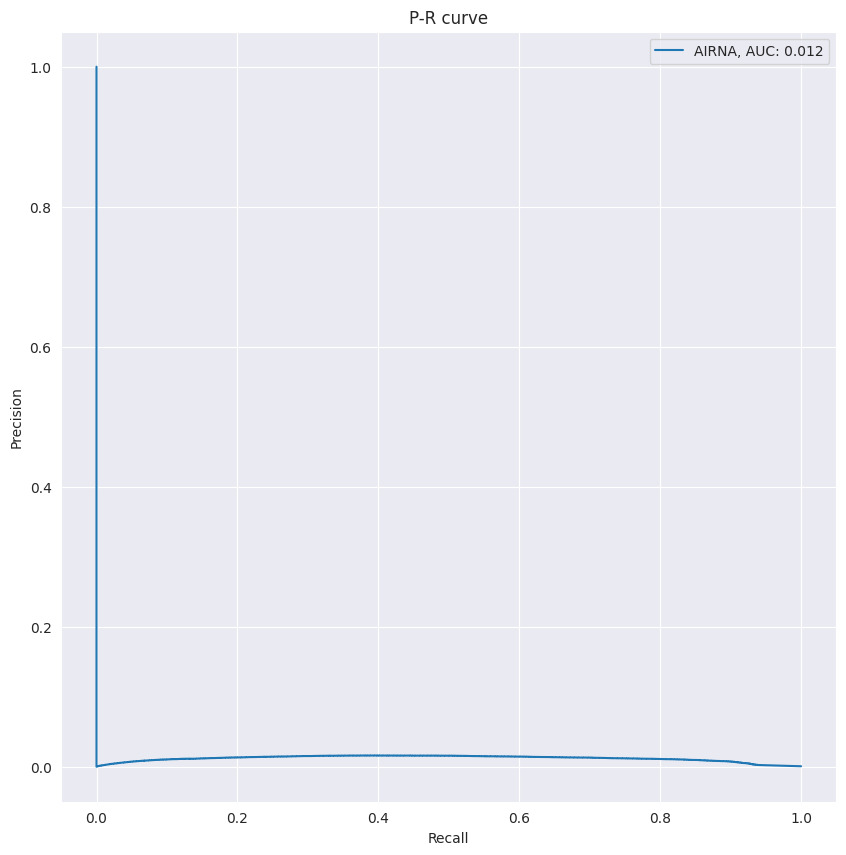

In [92]:
from sklearn.metrics import precision_recall_curve, auc

selected_df = pileup_damp_df[(~pileup_damp_df["drach"]) & (pileup_damp_df["count_dom"] >= 100) & (pileup_damp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


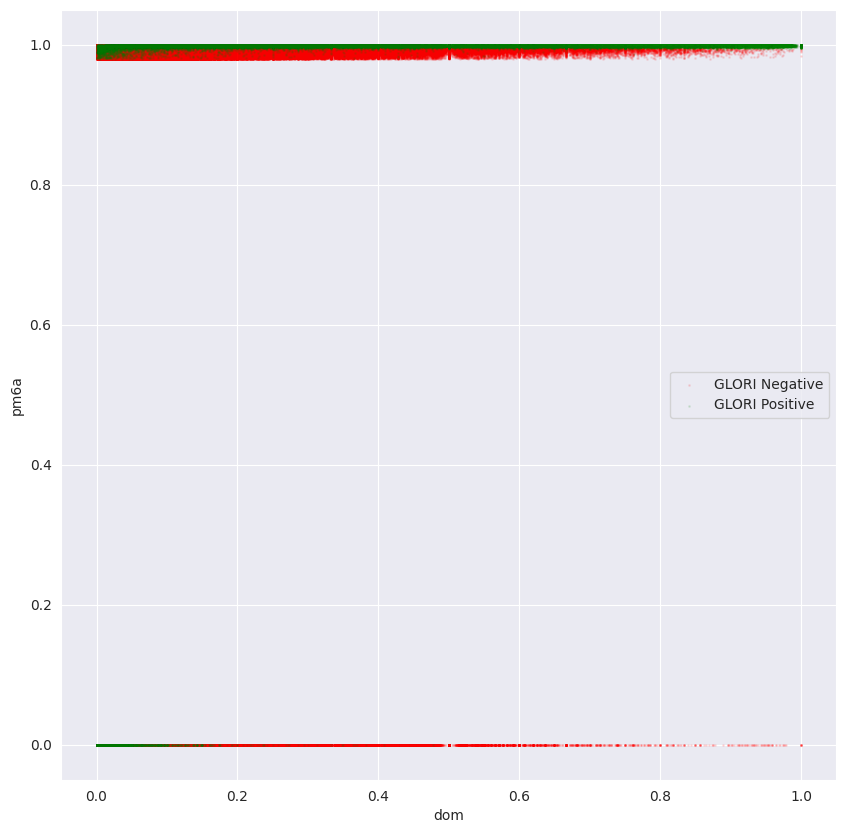

In [93]:

neg_df = pileup_damp_df[pileup_damp_df["dom_label"] == 0]
pos_df = pileup_damp_df[pileup_damp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a")
plt.show()
plt.close()

In [182]:
pileup_nodamp_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v2-20240827-175235-22-373000-token_normalise_dwell_all_npz-ON0090_allmotif_pileup_v2_nodamp/pileup.npz"
with np.load(pileup_nodamp_df, allow_pickle=True) as data:
    pileup_nodamp_df = pd.DataFrame({key: data[key] for key in data.keys()})
pileup_nodamp_df = pileup_nodamp_df[pileup_nodamp_df["count_dom"] >= 20]

print(pileup_nodamp_df)

pileup_nodamp_df = pileup_nodamp_df.merge(label_df_filtered, on="label_id", how="inner")

                label_id  pm6a  count_pm6a       dom  count_dom  count  \
0         NM_000016:1000   0.0           0  0.000000        258    258   
1         NM_000016:1008   0.0           0  0.000000        255    257   
2         NM_000016:1009   0.0           0  0.000000        258    260   
3         NM_000016:1010   0.0           0  0.011628        258    263   
4         NM_000016:1014   0.0           0  0.003968        252    258   
...                  ...   ...         ...       ...        ...    ...   
30894417    NR_184306:85   0.0           0  0.000000         45     51   
30894420    NR_184306:87   0.0           0  0.065217         46     51   
30894423    NR_184306:88   0.0           0  0.000000         45     51   
30894435    NR_184306:93   1.0          22  0.674419         43     50   
30894446    NR_184306:98   0.0           0  0.052632         38     48   

          logsum_pm6a  
0            0.000000  
1            0.000000  
2            0.000000  
3            0.

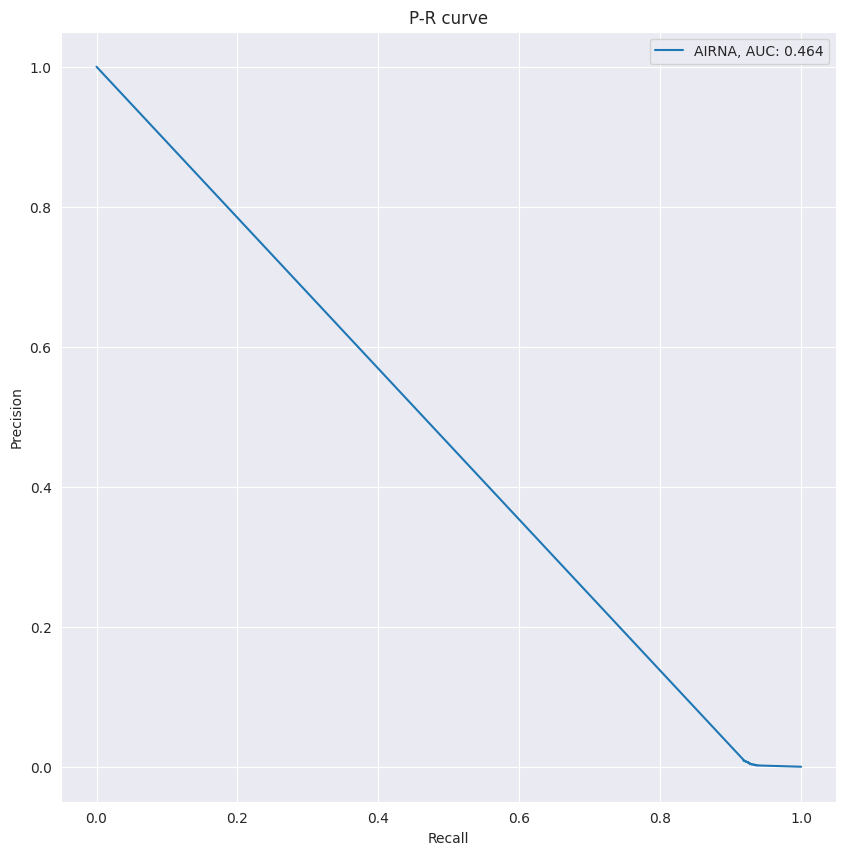

In [110]:
from sklearn.metrics import precision_recall_curve, auc

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


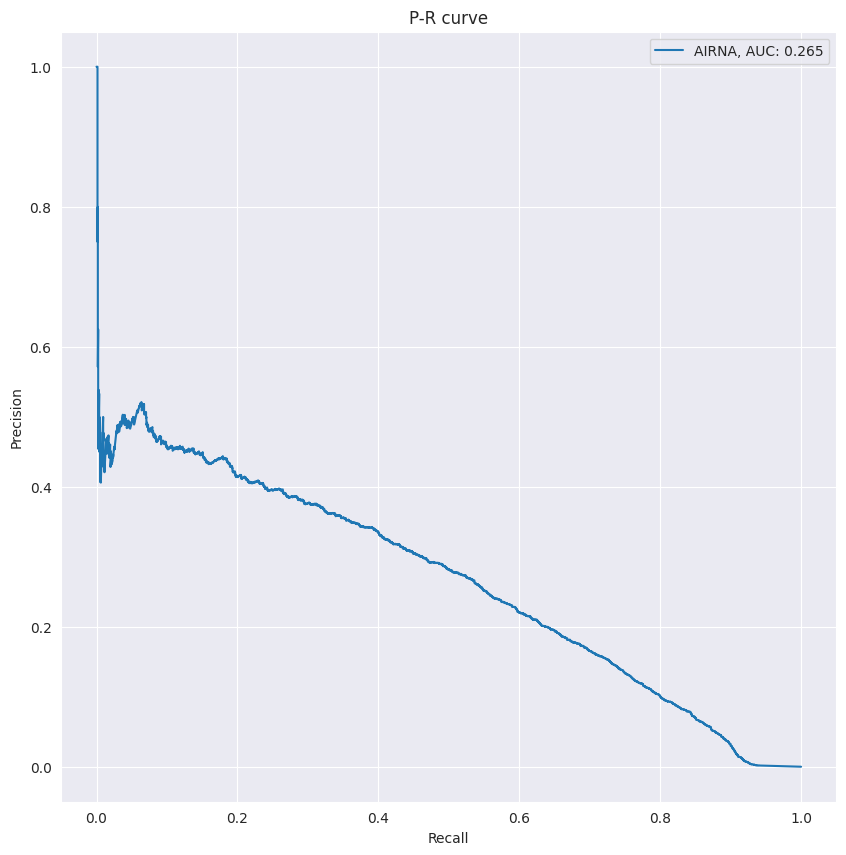

In [111]:
from sklearn.metrics import precision_recall_curve, auc

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["logsum_pm6a"]* -1)
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()

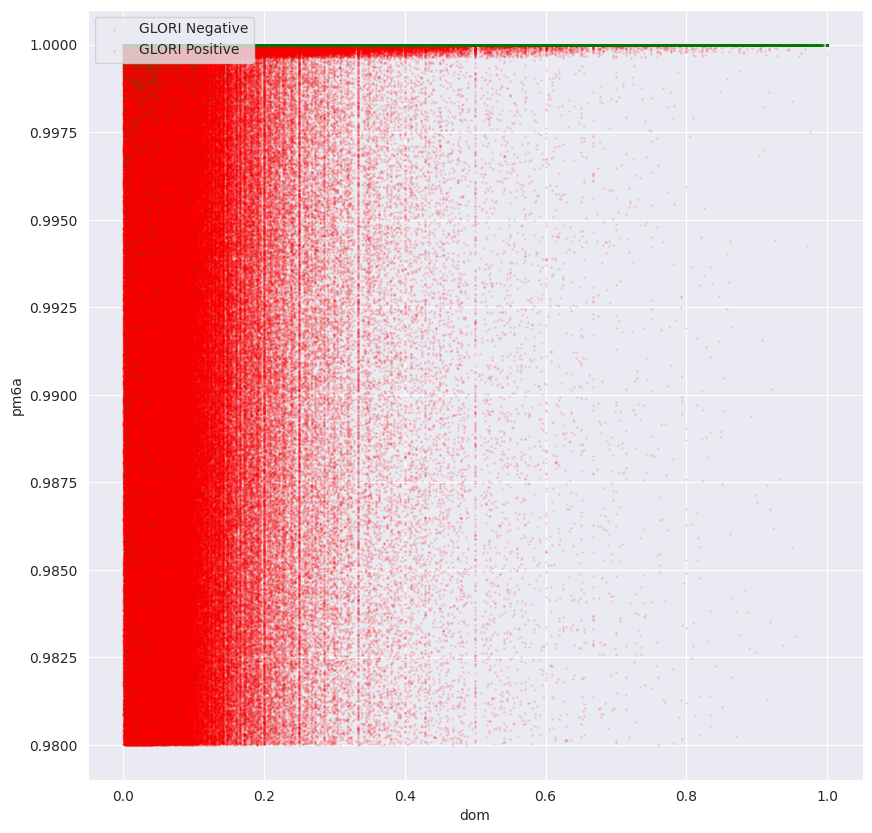

In [112]:
neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0]
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

neg_df = neg_df[neg_df["pm6a"] > 0.5]
pos_df = pos_df[pos_df["pm6a"] > 0.5]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend(loc="upper left")
ax.set_xlabel("dom")
ax.set_ylabel("pm6a")
plt.show()
plt.close()

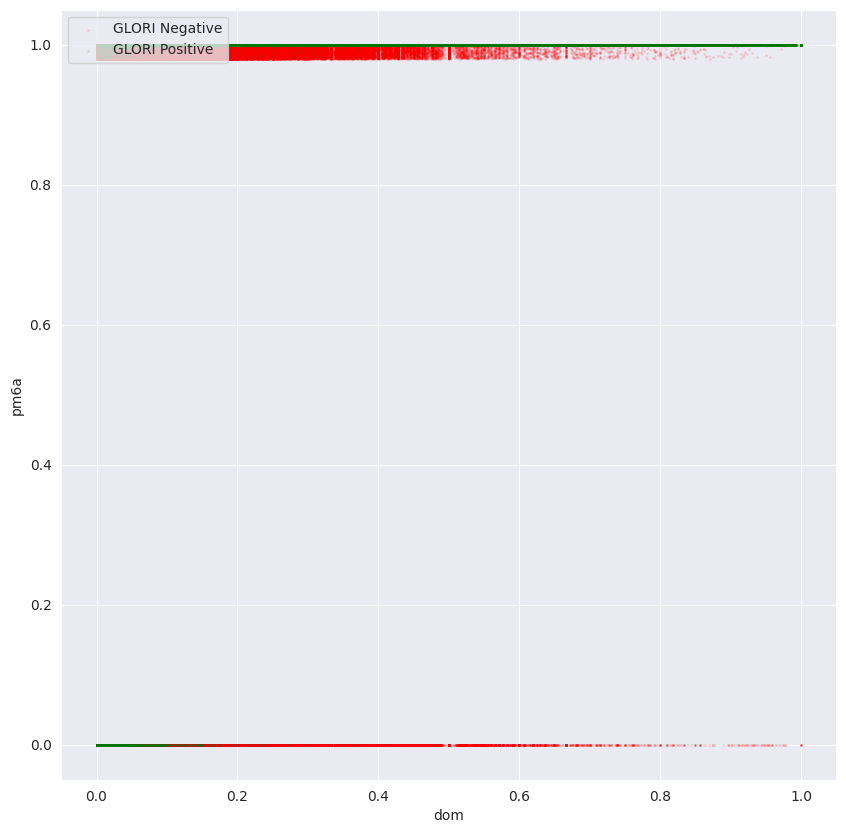

In [137]:
neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0]
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]


fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend(loc="upper left")
ax.set_xlabel("dom")
ax.set_ylabel("pm6a")
plt.show()
plt.close()

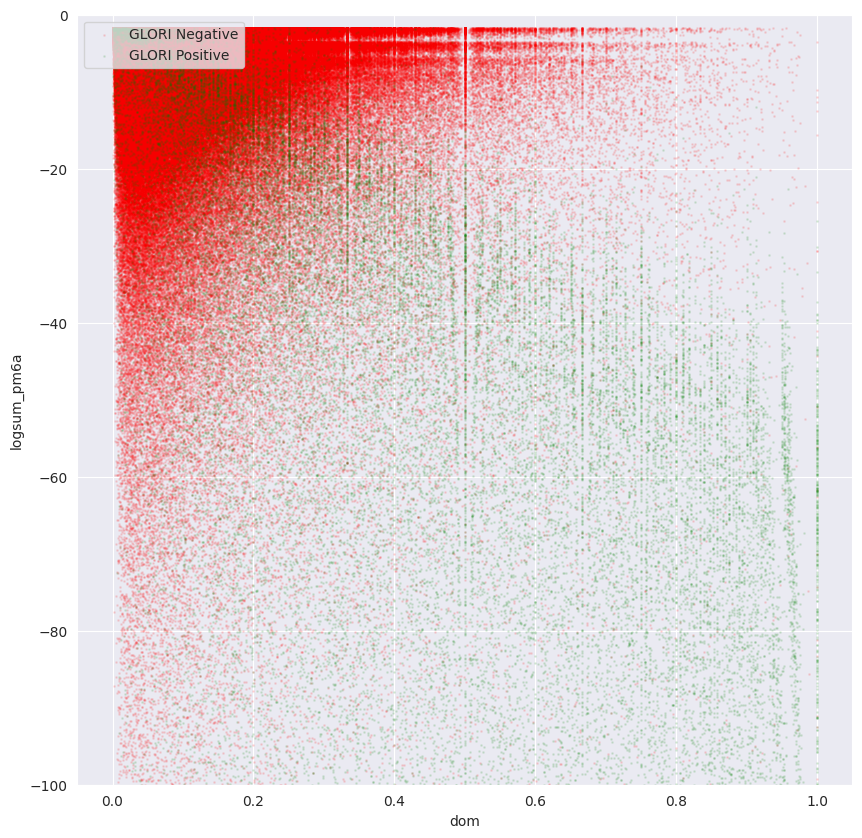

In [138]:
neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0]
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

neg_df = neg_df[neg_df["pm6a"] > 0.5]
pos_df = pos_df[pos_df["pm6a"] > 0.5]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["logsum_pm6a"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["logsum_pm6a"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend(loc="upper left")
ax.set_xlabel("dom")
ax.set_ylabel("logsum_pm6a")
ax.set_ylim(-100, 0)
plt.show()
plt.close()

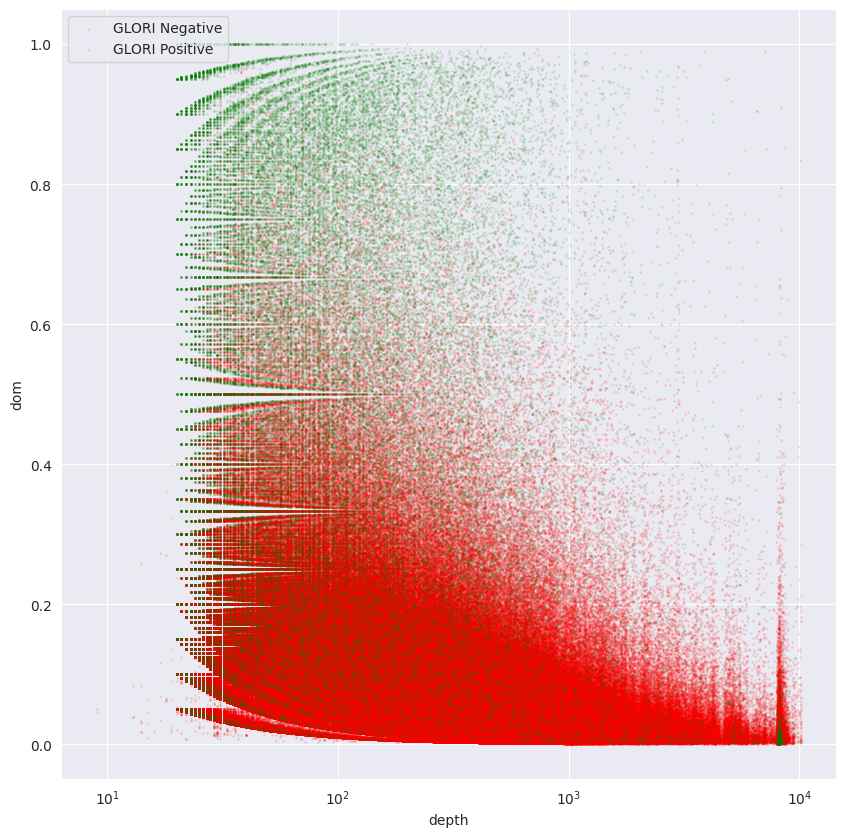

In [98]:
neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0]
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

neg_df = neg_df[neg_df["pm6a"] > 0.5]
pos_df = pos_df[pos_df["pm6a"] > 0.5]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["depth"], neg_df["dom"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["depth"], pos_df["dom"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend(loc="upper left")
ax.set_xscale("log") 
ax.set_xlabel("depth")
ax.set_ylabel("dom")
plt.show()
plt.close()

In [37]:
pileup_absdamp_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v2-20240827-175235-22-373000-token_normalise_dwell_all_npz-ON0090_allmotif_pileup_v2_damped_abs/pileup.npz"
with np.load(pileup_absdamp_df, allow_pickle=True) as data:
    pileup_absdamp_df = pd.DataFrame({key: data[key] for key in data.keys()})
pileup_absdamp_df = pileup_absdamp_df[pileup_absdamp_df["count_dom"] >= 20]
pileup_absdamp_df = pileup_absdamp_df.merge(label_df_filtered, on="label_id", how="inner")
pileup_absdamp_df["threshold"] = 1-((0.9 ** (1-pileup_absdamp_df["dom"])) * (0.02 ** (pileup_absdamp_df["dom"])))
pileup_absdamp_df["discarded_ratio"] = (pileup_absdamp_df["count_dom"] - pileup_absdamp_df["count_pm6a"]) / pileup_absdamp_df["count_dom"]


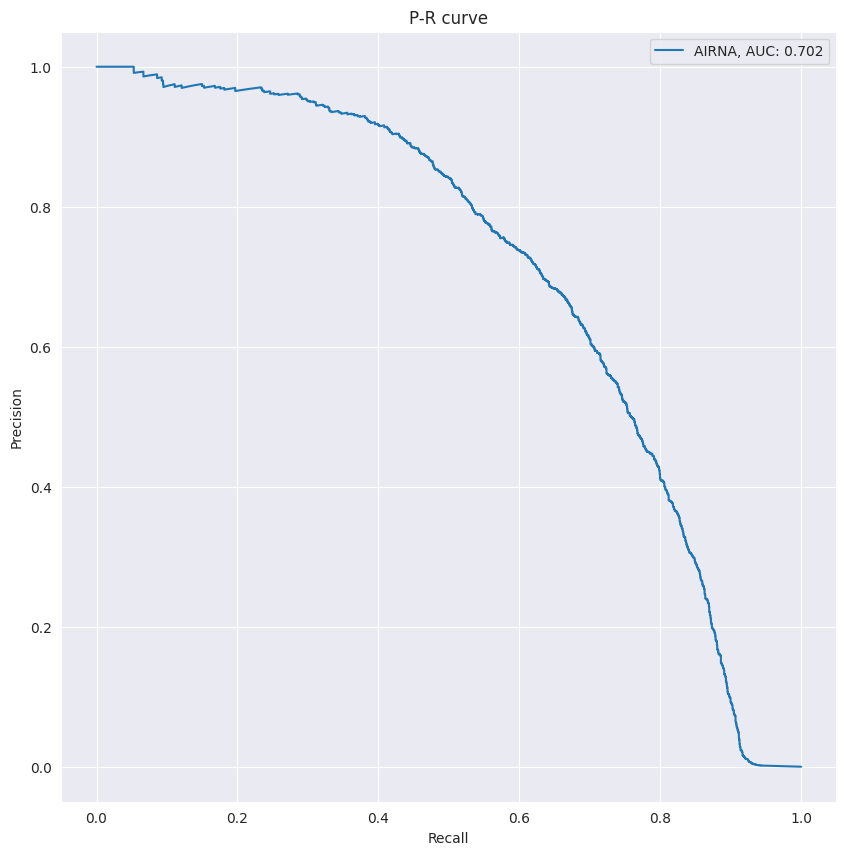

In [38]:
from sklearn.metrics import precision_recall_curve, auc

selected_df = pileup_absdamp_df[(~pileup_absdamp_df["drach"]) & (pileup_absdamp_df["count_dom"] >= 100) & (pileup_absdamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"AIRNA, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


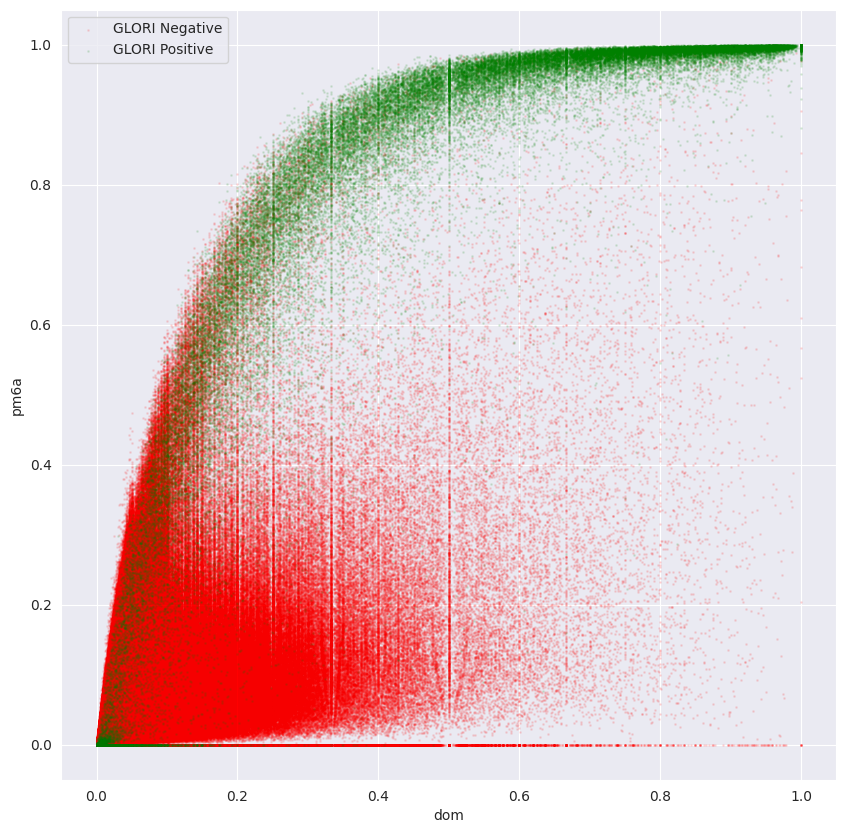

In [40]:
neg_df = pileup_absdamp_df[pileup_absdamp_df["dom_label"] == 0]
pos_df = pileup_absdamp_df[pileup_absdamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a")
plt.show()
plt.close()

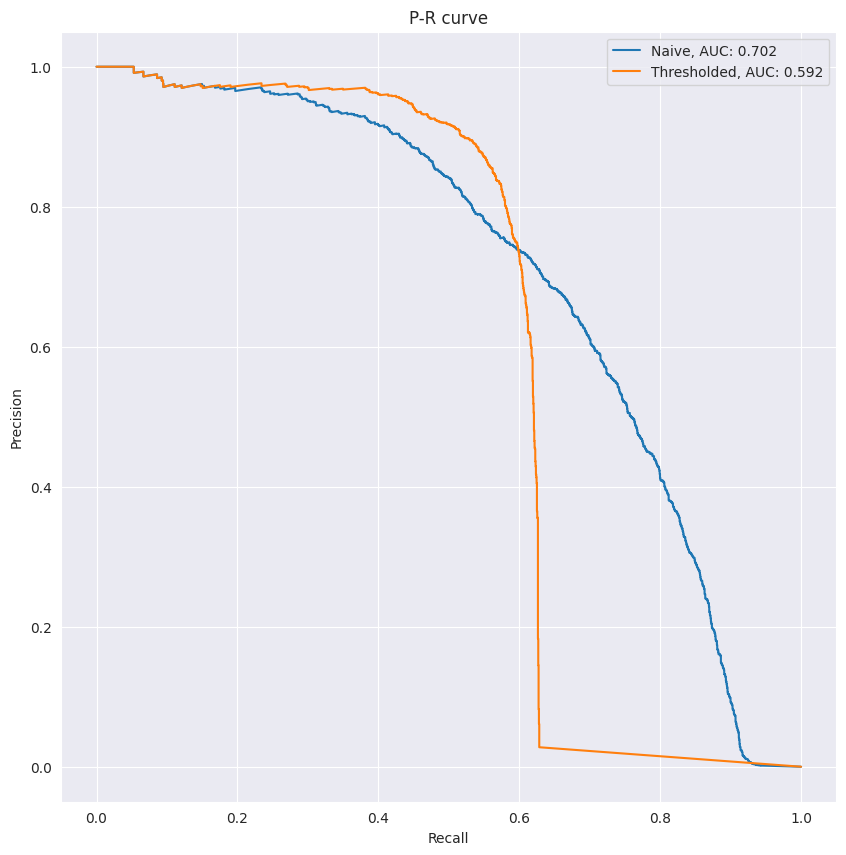

In [49]:

selected_df = pileup_absdamp_df[(~pileup_absdamp_df["drach"]) & (pileup_absdamp_df["count_dom"] >= 100) & (pileup_absdamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["threshold"] = 1-(0.02 ** (selected_df["dom"]))
selected_df["pm6a_thr"] = selected_df["pm6a"] * (selected_df["pm6a"] > selected_df["threshold"])
 
fig, ax = plt.subplots(1, 1, figsize=(10, 10))


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Naive, AUC: {auc_score:.3f}")


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_thr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Thresholded, AUC: {auc_score:.3f}") 

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


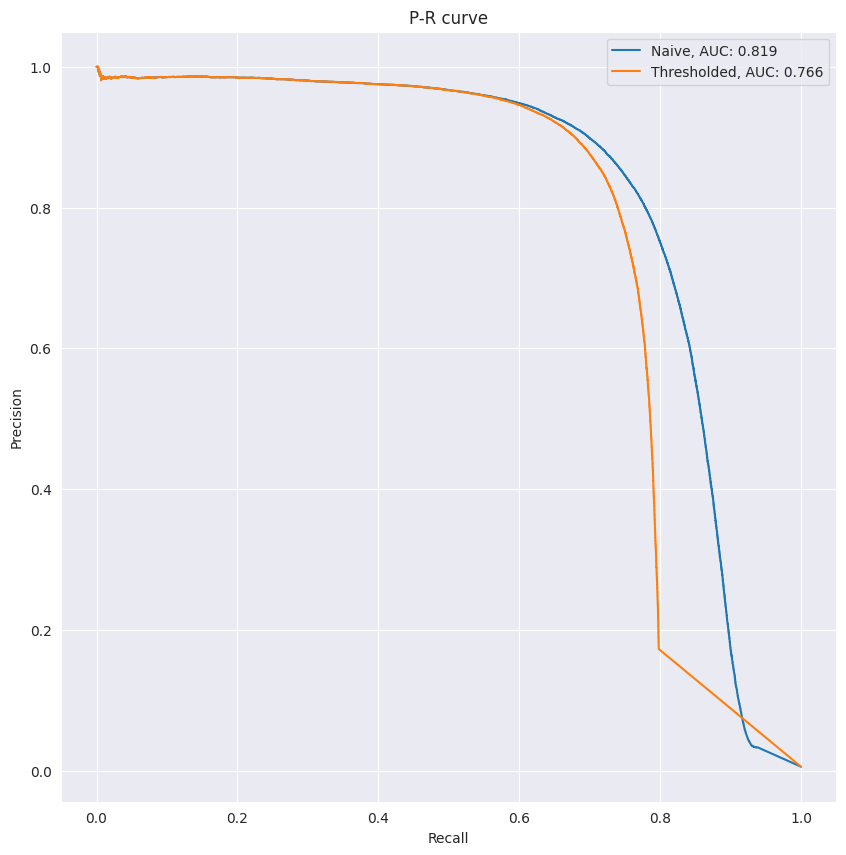

In [51]:

selected_df = pileup_absdamp_df[(pileup_absdamp_df["count_dom"] >= 20) & (pileup_absdamp_df["label"] >= 0)]
selected_df["threshold"] = 1-(0.02 ** (selected_df["dom"]))
selected_df["pm6a_thr"] = selected_df["pm6a"] * (selected_df["pm6a"] > selected_df["threshold"])

fig, ax = plt.subplots(1, 1, figsize=(10, 10))


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Naive, AUC: {auc_score:.3f}")


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_thr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Thresholded, AUC: {auc_score:.3f}")

ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


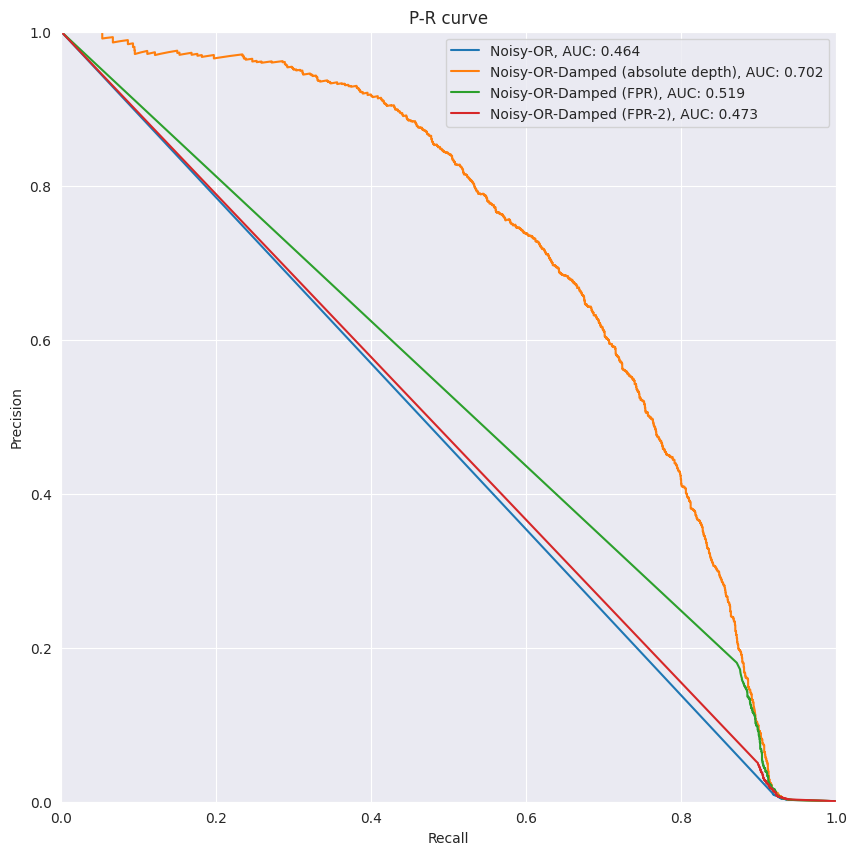

In [156]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.0027

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = 1-(10**(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None)))
selected_df["pm6a_damp_fpr"] = 1-(10**(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])))


fpr_damp = np.clip((1-selected_df["count"]/np.clip(selected_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
selected_df["pm6a_damp_fpr_2"] = 1-(10**(selected_df["logsum_pm6a"]*fpr_damp))
selected_df = selected_df.fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_abs"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (absolute depth), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr_2"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR-2), AUC: {auc_score:.3f}")



ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.show()
plt.close()


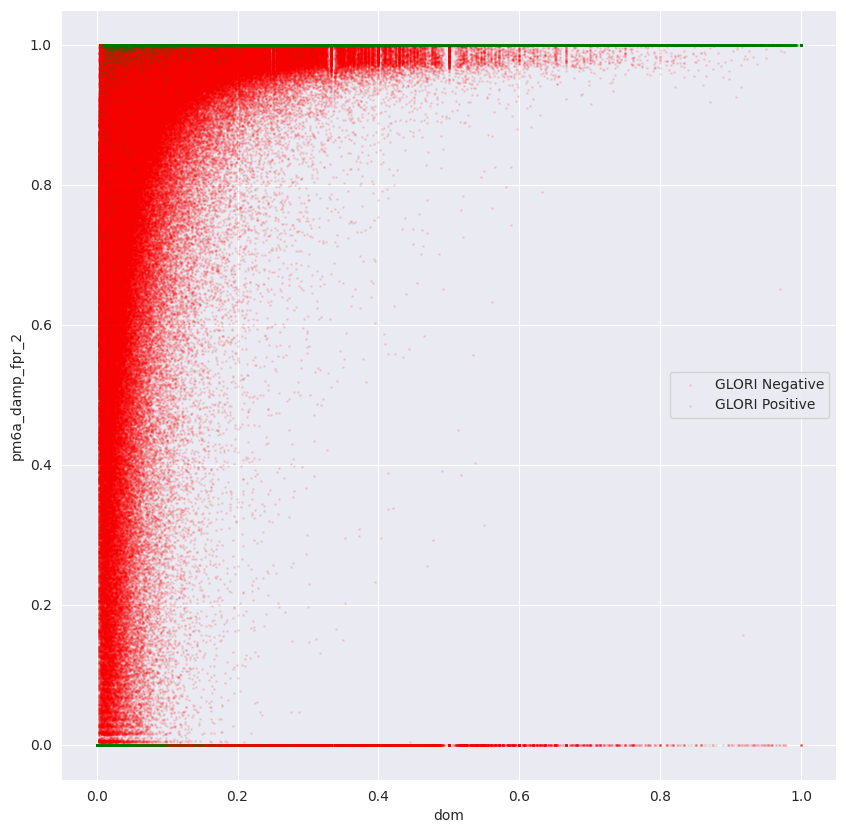

In [161]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr_2"] = 1-(10**(pileup_nodamp_df["logsum_pm6a"]*fpr_damp))


neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0]
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr_2"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr_2"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr_2")
plt.show()
plt.close()

count    1.066736e+07
mean     1.348221e-01
std      3.340061e-01
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.000000e+00
Name: pm6a_damp_fpr_2, dtype: float64


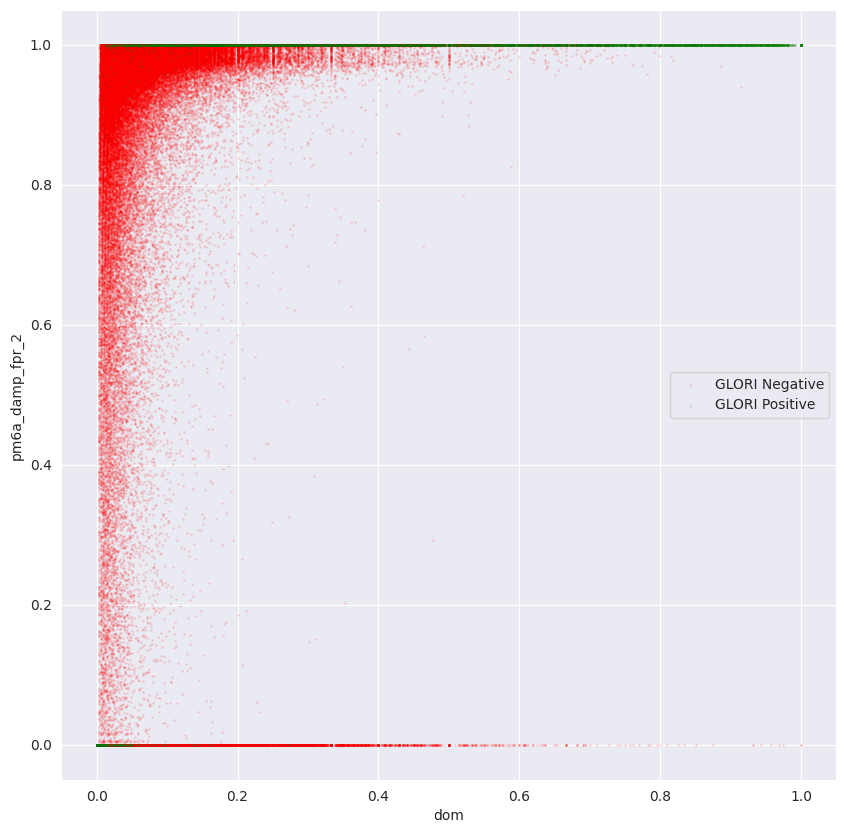

In [160]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr_2"] = 1-(10**(pileup_nodamp_df["logsum_pm6a"]*fpr_damp))

print(pileup_nodamp_df["pm6a_damp_fpr_2"].describe())

neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0].sample(frac=0.1)
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0].sample(frac=0.1)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr_2"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr_2"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr_2")
plt.show()
plt.close()

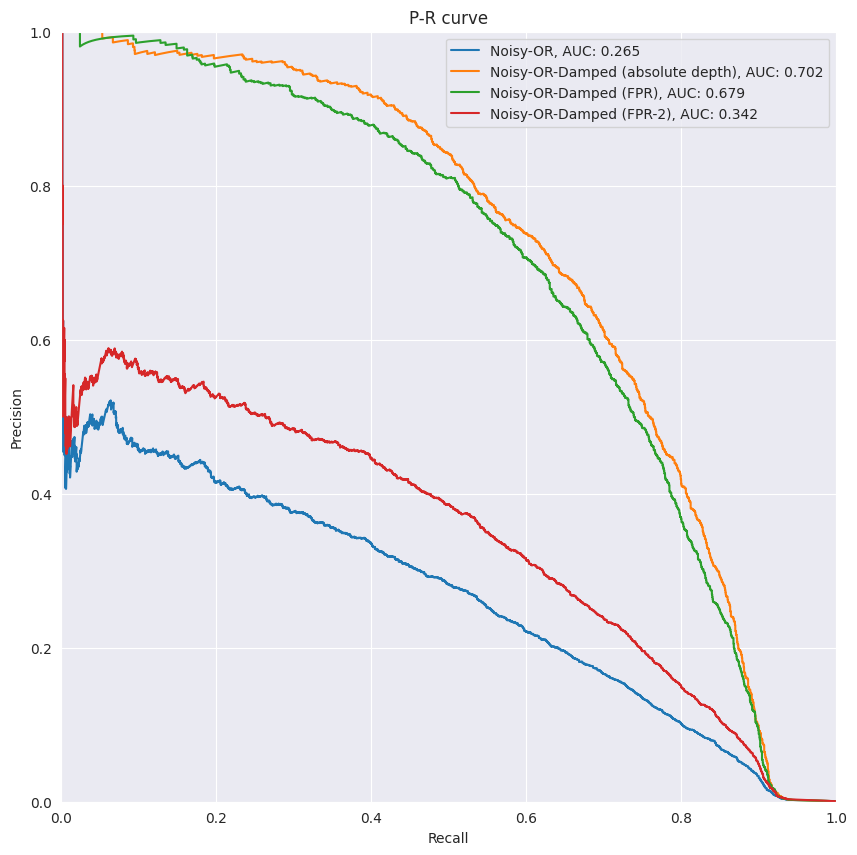

In [173]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.003

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = -(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None))
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))


fpr_damp = np.clip((1-selected_df["count"]/np.clip(selected_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
selected_df["pm6a_damp_fpr_2"] = -(selected_df["logsum_pm6a"]*fpr_damp)
selected_df = selected_df.fillna(0)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["logsum_pm6a"] * -1)
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_abs"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (absolute depth), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr_2"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR-2), AUC: {auc_score:.3f}")



ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.show()
plt.close()


count    3.185562e+06
mean     7.864646e-01
std      4.359388e+00
min     -0.000000e+00
25%      0.000000e+00
50%     -0.000000e+00
75%      8.861757e-01
max      6.900378e+02
Name: pm6a_damp_fpr, dtype: float64


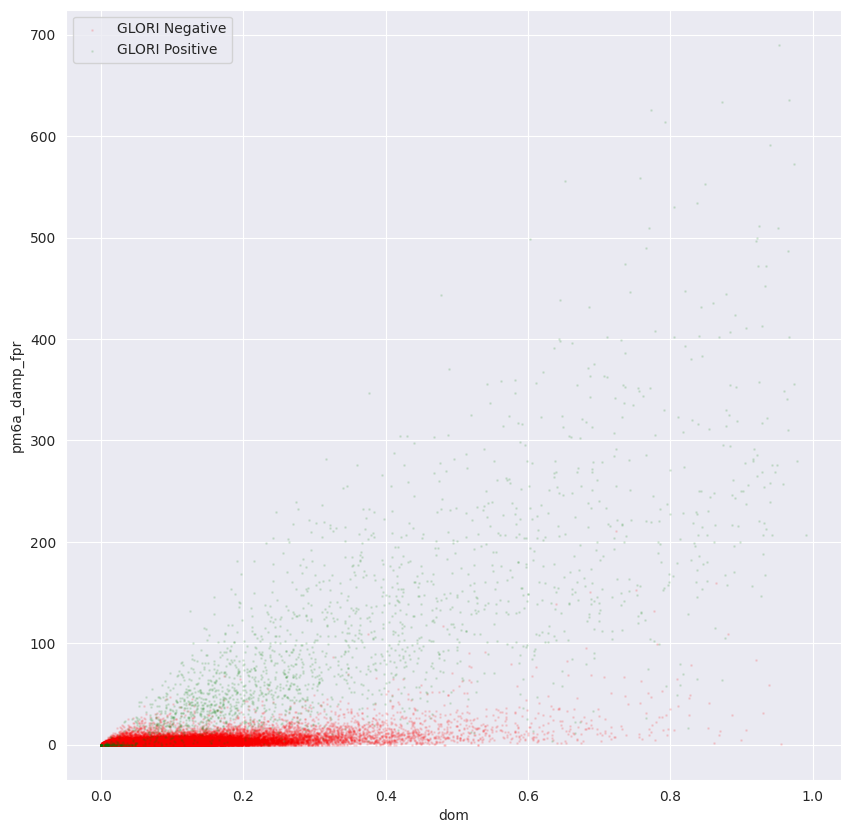

In [167]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))

print(pileup_nodamp_df["pm6a_damp_fpr"].describe())

neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0].sample(frac=0.1)
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close()

count    3.185562e+06
mean     7.589497e-01
std      2.882628e+00
min     -0.000000e+00
25%      0.000000e+00
50%     -0.000000e+00
75%      8.861757e-01
max      1.000000e+02
Name: pm6a_damp_fpr, dtype: float64


/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


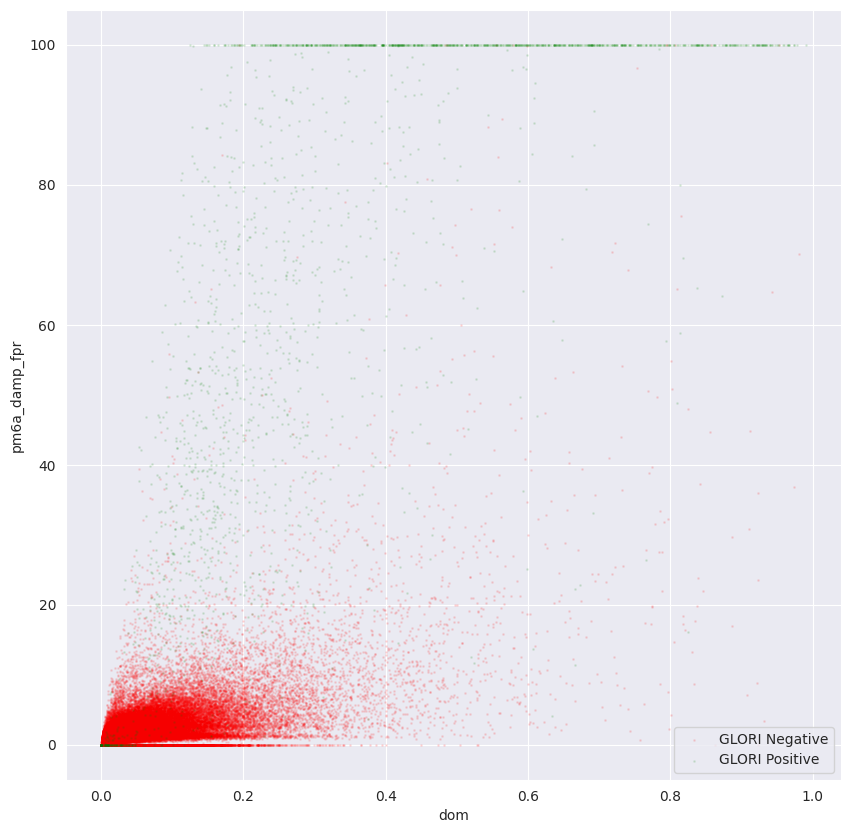

In [168]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr"] = np.clip(-(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])),0,100)

print(pileup_nodamp_df["pm6a_damp_fpr"].describe())

neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0].sample(frac=0.1)
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close()

count    3.185562e+06
mean     7.589497e-01
std      2.882628e+00
min     -0.000000e+00
25%      0.000000e+00
50%     -0.000000e+00
75%      8.861757e-01
max      1.000000e+02
Name: pm6a_damp_fpr, dtype: float64


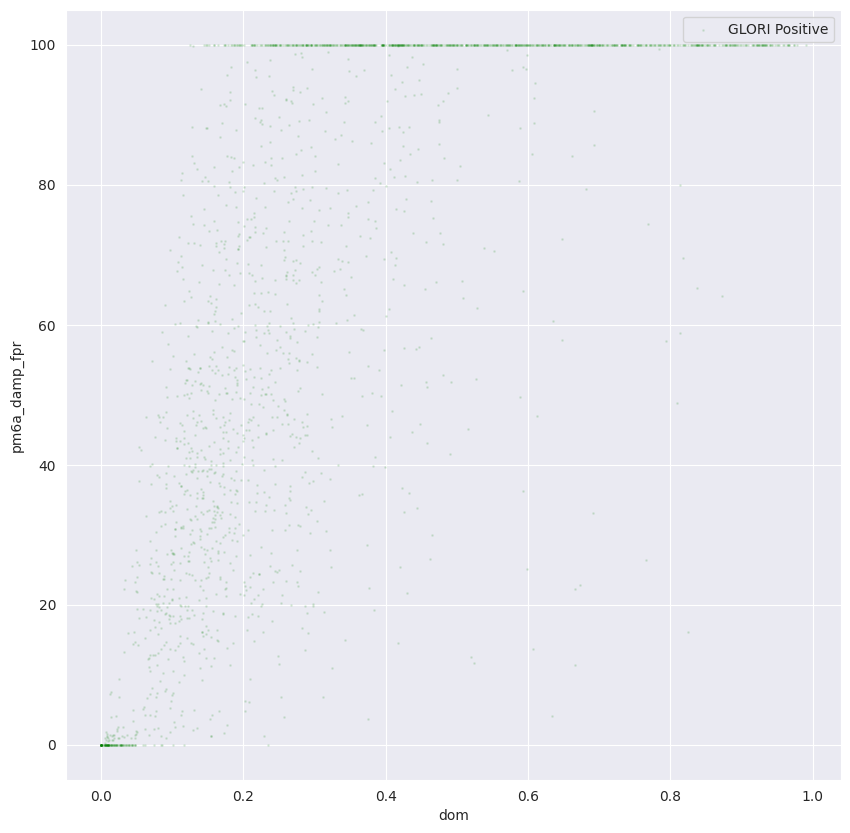

In [171]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr"] = np.clip(-(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])),0,100)

print(pileup_nodamp_df["pm6a_damp_fpr"].describe())

pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close()

count    3.185562e+06
mean     7.589497e-01
std      2.882628e+00
min     -0.000000e+00
25%      0.000000e+00
50%     -0.000000e+00
75%      8.861757e-01
max      1.000000e+02
Name: pm6a_damp_fpr, dtype: float64


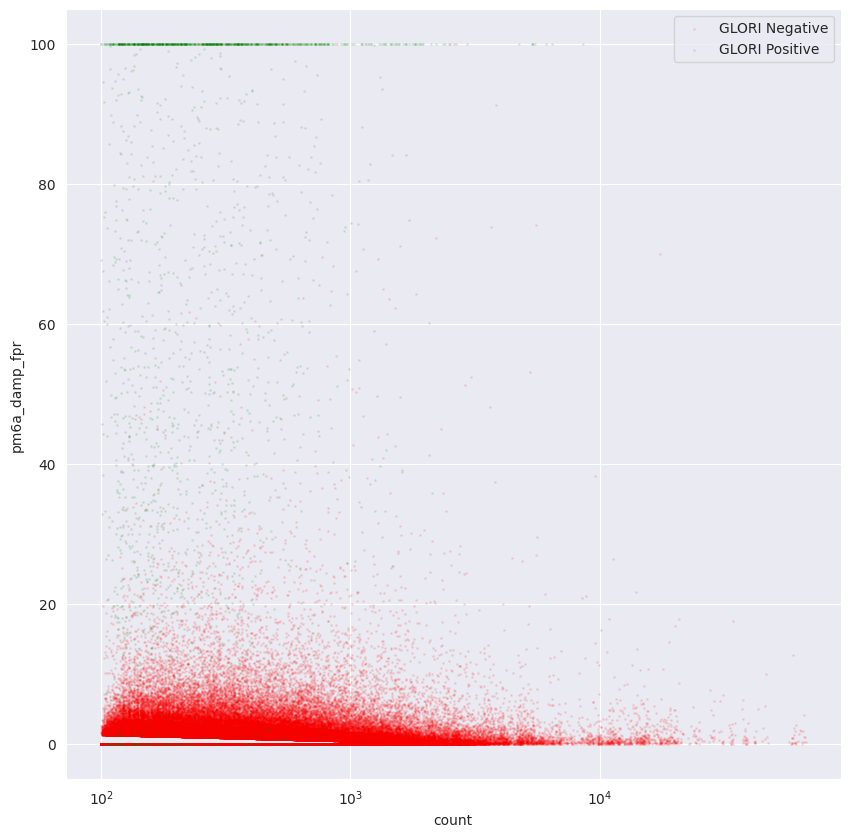

In [175]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr"] = np.clip(-(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])),0,100)

print(pileup_nodamp_df["pm6a_damp_fpr"].describe())

neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0].sample(frac=0.1)
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["count"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("count")
ax.set_xscale("log")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close()

count    3.185562e+06
mean     7.864646e-01
std      4.359388e+00
min     -0.000000e+00
25%      0.000000e+00
50%     -0.000000e+00
75%      8.861757e-01
max      6.900378e+02
Name: pm6a_damp_fpr, dtype: float64


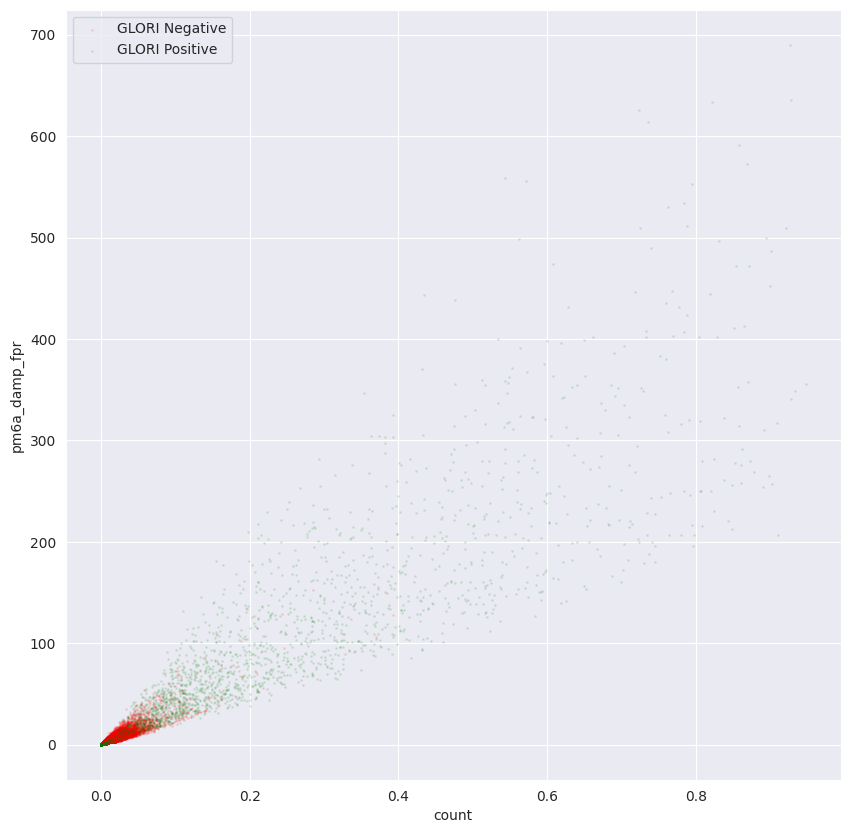

In [177]:

fpr = 0.0027
fpr_damp = np.clip((1-pileup_nodamp_df["count"]/np.clip(pileup_nodamp_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
pileup_nodamp_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))

print(pileup_nodamp_df["pm6a_damp_fpr"].describe())

neg_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] == 0].sample(frac=0.1)
pos_df = pileup_nodamp_df[pileup_nodamp_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/neg_df["count"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label="GLORI Negative")
ax.scatter(pos_df["count_pm6a"]/pos_df["count"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label="GLORI Positive")
ax.legend()
ax.set_xlabel("count")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close()

/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


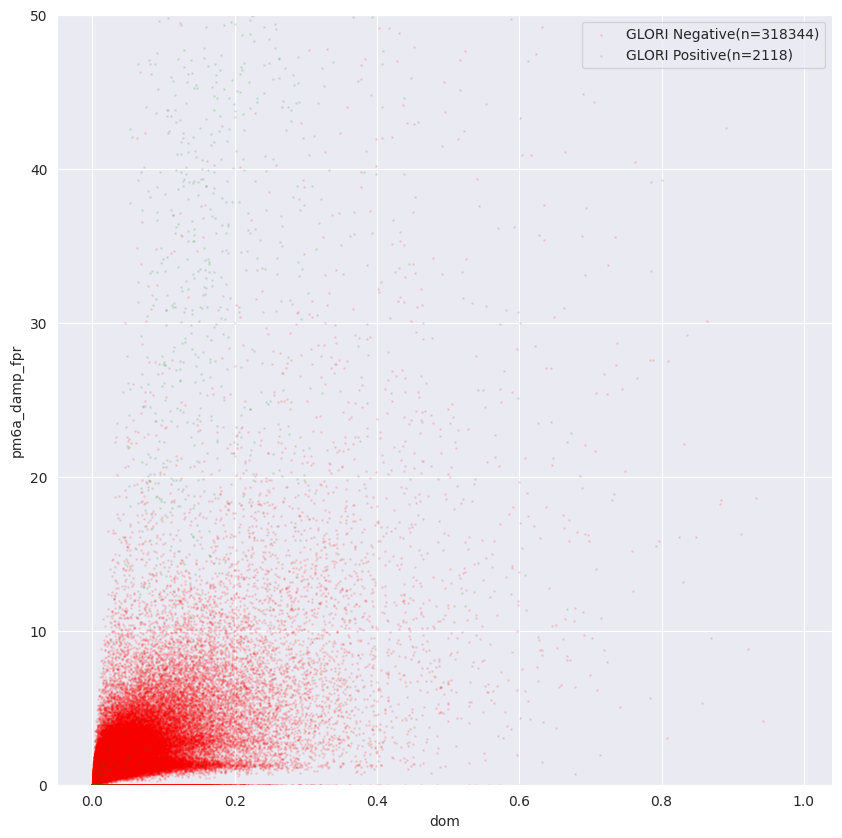

In [213]:
fpr = 0.0027

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
fpr_damp = np.clip((1-selected_df["count"]/np.clip(selected_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))


neg_df = selected_df[selected_df["label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
ax.set_ylim(0,50)
plt.show()
plt.close()

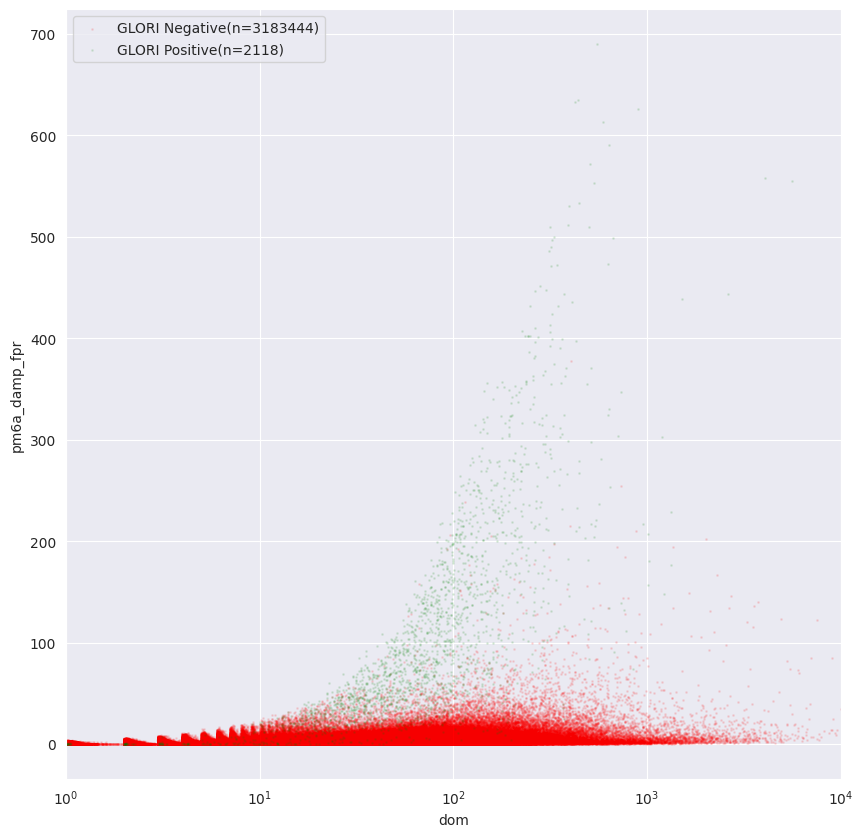

In [233]:
fpr = 0.0027
selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
fpr_damp = np.clip((1-selected_df["count"]/np.clip(selected_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"] * neg_df["count"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"] * pos_df["count"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
ax.set_xlim(1, 10000)
ax.set_xscale("log")
plt.show()
plt.close() 

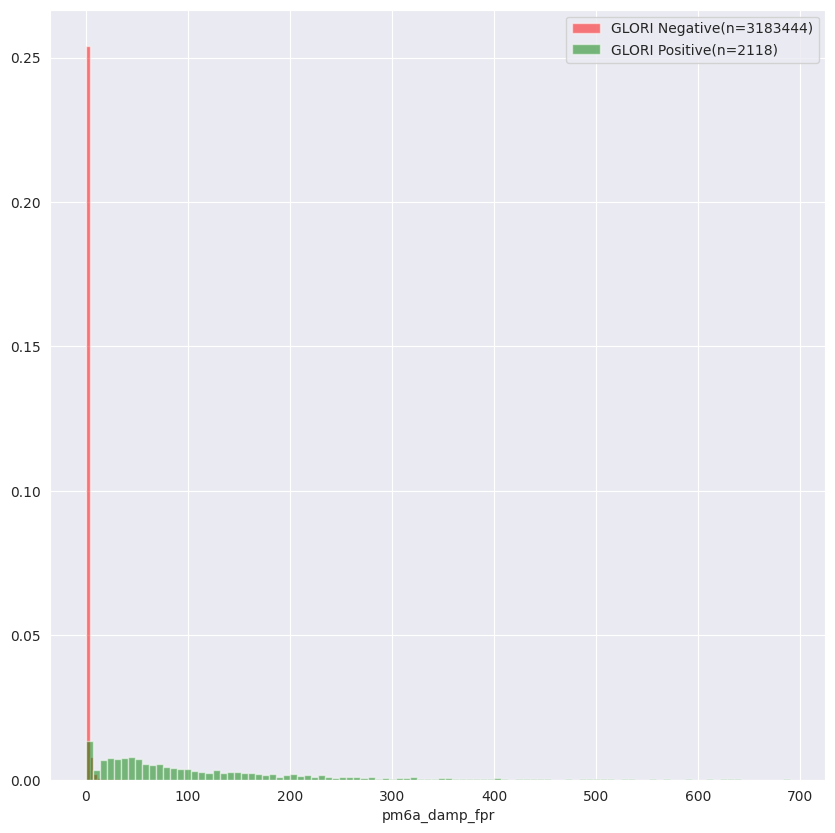

In [222]:
fpr = 0.0027
selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
fpr_damp = np.clip((1-selected_df["count"]/np.clip(selected_df["count_pm6a"],1,None)*fpr)/(1-fpr),0,None)
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.hist(neg_df["pm6a_damp_fpr"], bins=100, alpha=0.5, color="red", label=f"GLORI Negative(n={len(neg_df)})", density=True)
ax.hist(pos_df["pm6a_damp_fpr"], bins=100, alpha=0.5, color="green", label=f"GLORI Positive(n={len(pos_df)})", density=True)
ax.legend()
ax.set_xlabel("pm6a_damp_fpr")
plt.show()

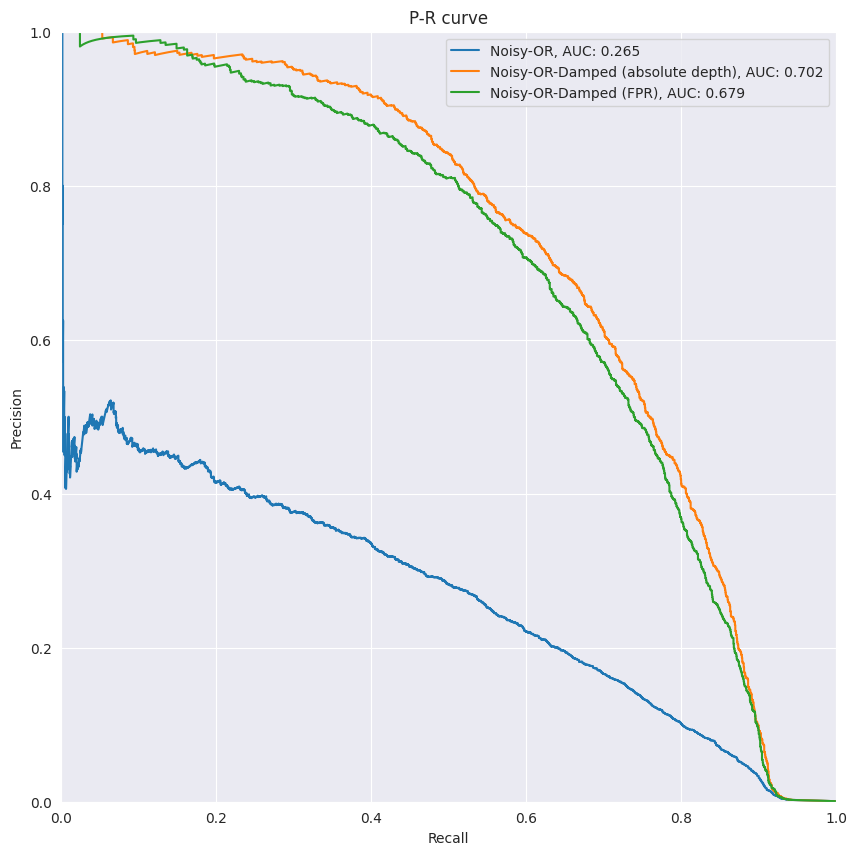

In [266]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.003

selected_df = pileup_nodamp_df[(~pileup_nodamp_df["drach"]) & (pileup_nodamp_df["count_dom"] >= 100) & (pileup_nodamp_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = -(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None))
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))
selected_df["pm6a_damp_fpr_thr"] = selected_df["pm6a_damp_fpr"] * (selected_df["count"] < 2000)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["logsum_pm6a"] * -1)
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_abs"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (absolute depth), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR), AUC: {auc_score:.3f}")
# 
# precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr_thr"])
# auc_score = auc(recall, precision)
# ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR-Thresholded), AUC: {auc_score:.3f}")
# 


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.show()
plt.close()


In [234]:
pca_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v2-20240827-175235-22-373000-token_normalise_dwell_all_npz-ON0090_allmotif_pileup_pca/pileup.npz"
with np.load(pca_df, allow_pickle=True) as data:
    pca_df = pd.DataFrame({key: data[key] for key in data.keys()})
pca_df = pca_df[pca_df["count_dom"] >= 20]
pca_df = pca_df.merge(label_df_filtered, on="label_id", how="inner")
print(pca_df)

                label_id      pm6a  count_pm6a  pca  count_pca  logsum_pca  \
0         NM_000016:1000  0.000000           0  1.0        257 -902.102905   
1         NM_000016:1008  0.000000           0  1.0        253 -859.749207   
2         NM_000016:1009  0.000000           0  1.0        257 -812.729980   
3         NM_000016:1010  0.000000           0  1.0        253 -802.167664   
4         NM_000016:1014  0.000000           0  1.0        247 -787.727905   
...                  ...       ...         ...  ...        ...         ...   
10667360  NR_182669:3964  0.000000           0  1.0         49 -136.232864   
10667361  NR_182669:3965  0.000000           0  1.0         51 -153.898758   
10667362  NR_182669:3966  0.000000           0  1.0         43 -117.553360   
10667363  NR_182669:3968  0.986174           1  1.0         43 -114.269585   
10667364  NR_182669:3969  0.000000           0  1.0         38 -108.457230   

               dom  count_dom  count  logsum_pm6a  depth  label

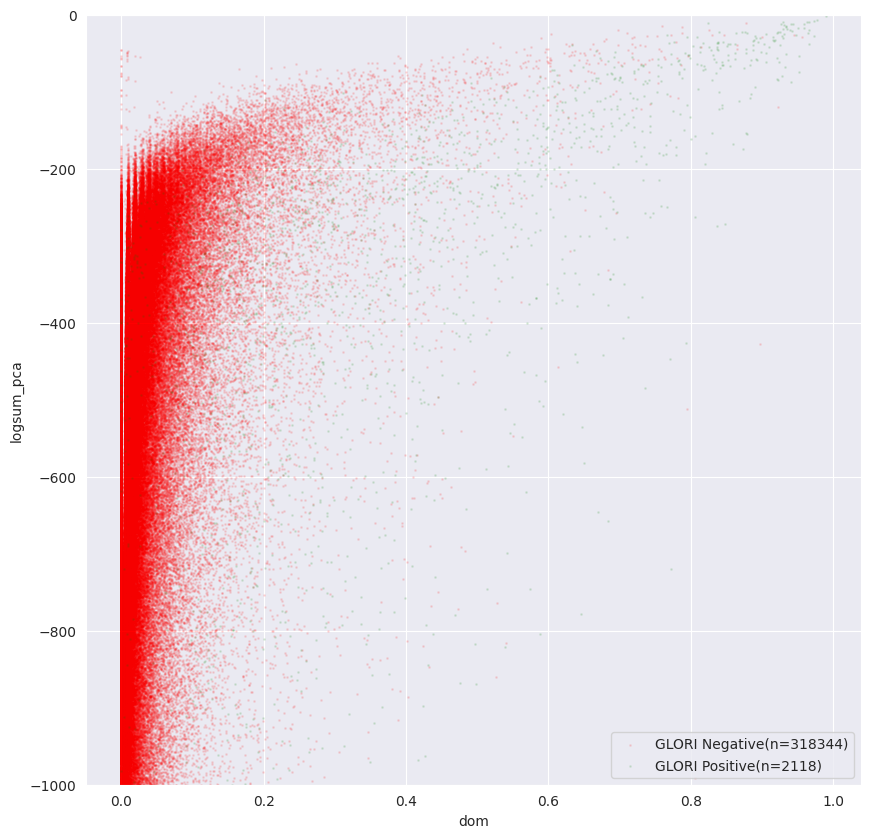

In [240]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["logsum_pca"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["logsum_pca"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("logsum_pca")
ax.set_ylim(-1000,0)
plt.show()
plt.close() 

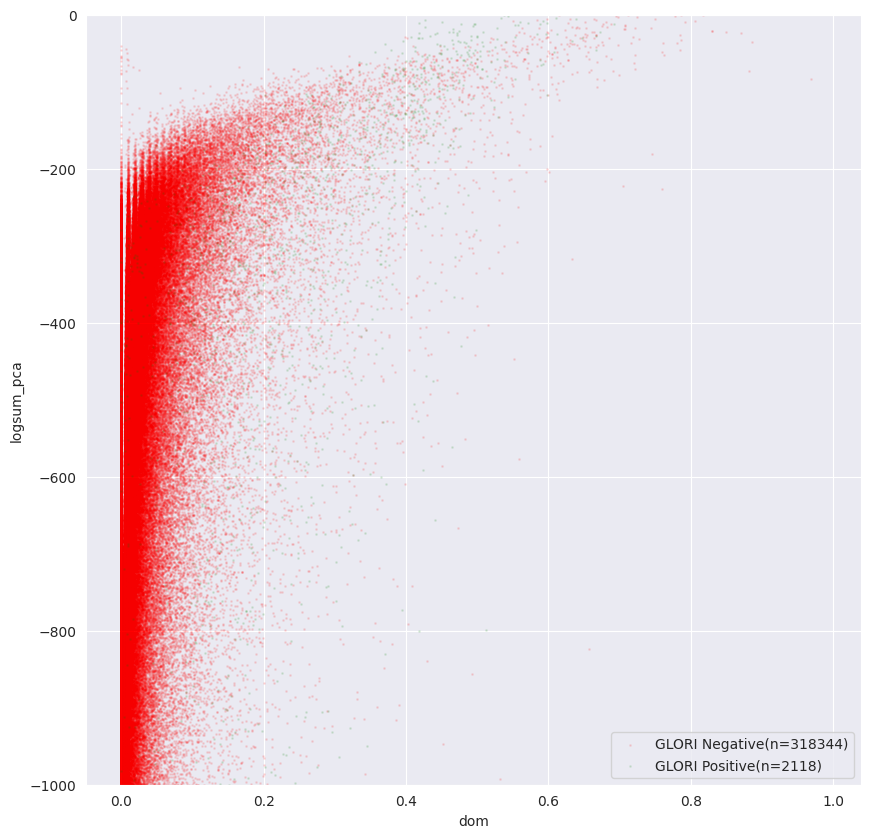

In [243]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["logsum_diff"] = -selected_df["logsum_pm6a"] + selected_df["logsum_pca"]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["logsum_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["logsum_diff"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("logsum_pca")
ax.set_ylim(-1000,0)
plt.show()
plt.close() 

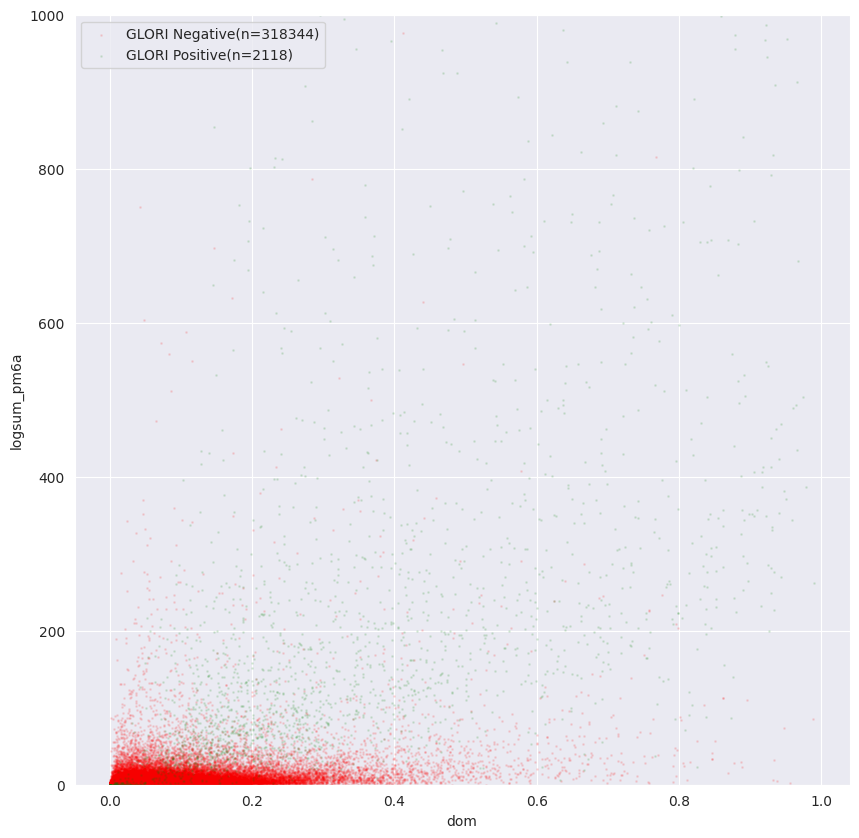

In [245]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["logsum_diff"] = selected_df["logsum_pm6a"] + selected_df["logsum_pca"]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], -neg_df["logsum_pm6a"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], -pos_df["logsum_pm6a"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("logsum_pm6a")
ax.set_ylim(0,1000)
plt.show()
plt.close() 

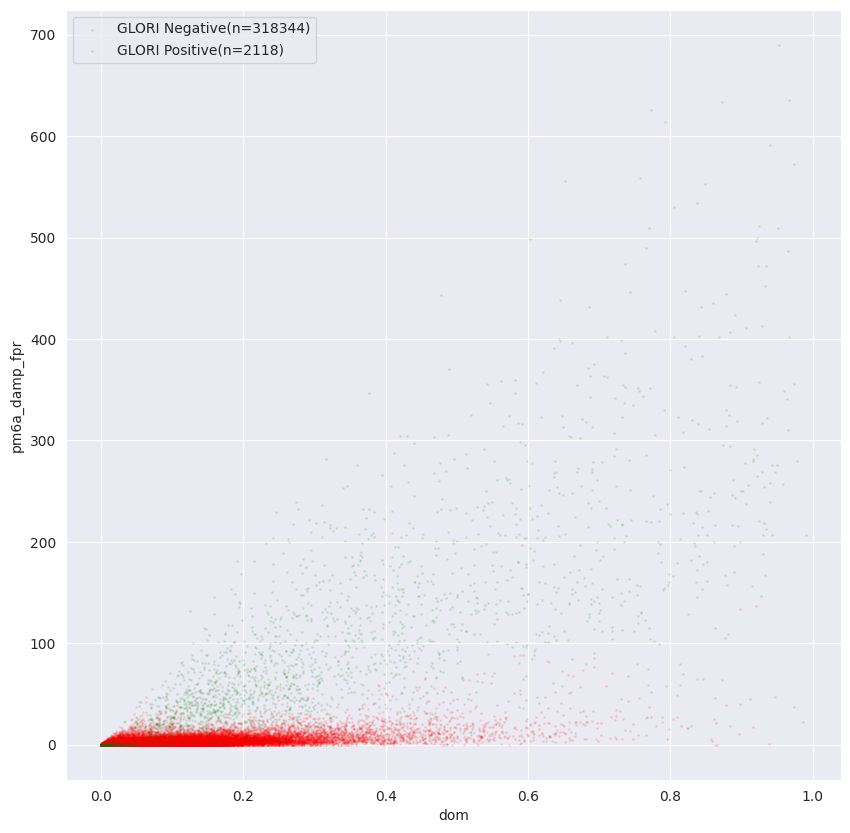

In [246]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")
plt.show()
plt.close() 

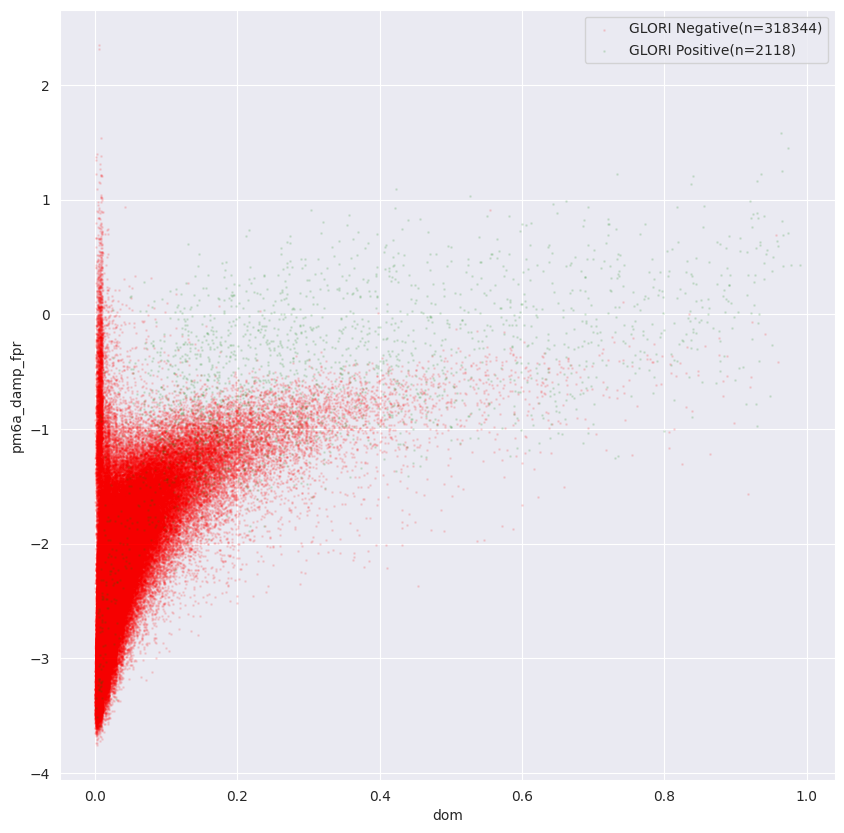

In [265]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(selected_df["count"]*selected_df["dom"])) + selected_df["logsum_pca"]/(selected_df["count"]*(1-selected_df["dom"]))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_damp_fpr")

plt.show()
plt.close() 

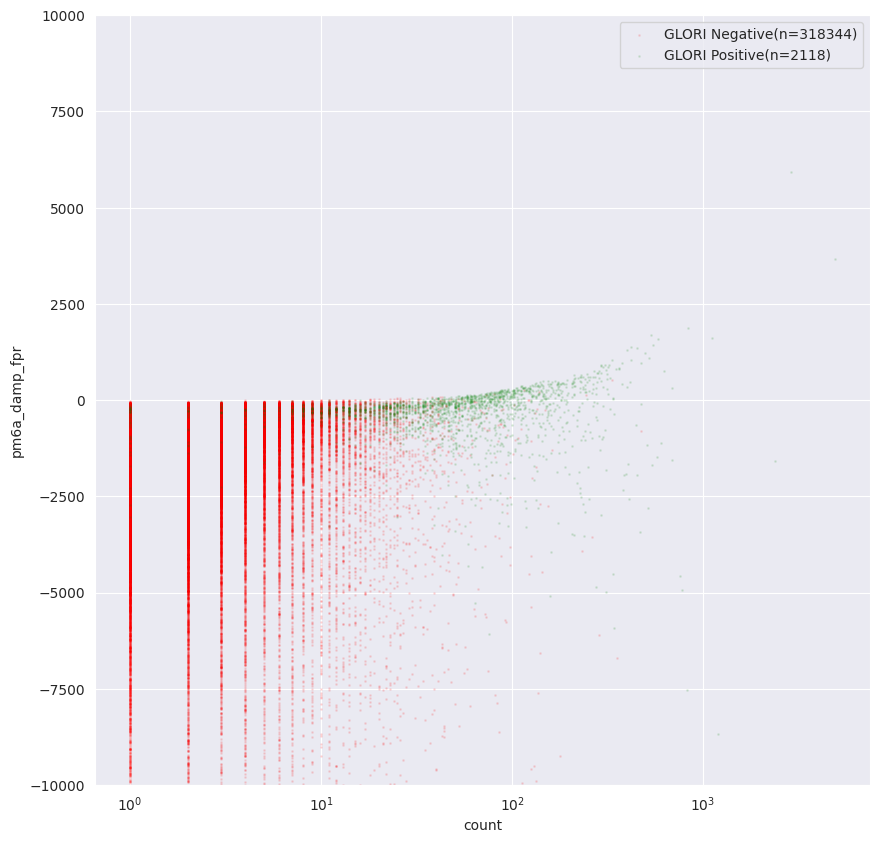

In [262]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])) + selected_df["logsum_pca"]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"], neg_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"], pos_df["pm6a_damp_fpr"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("count")
ax.set_ylabel("pm6a_damp_fpr")
ax.set_xscale("log")
ax.set_ylim(-10000,0)
plt.show()
plt.close() 

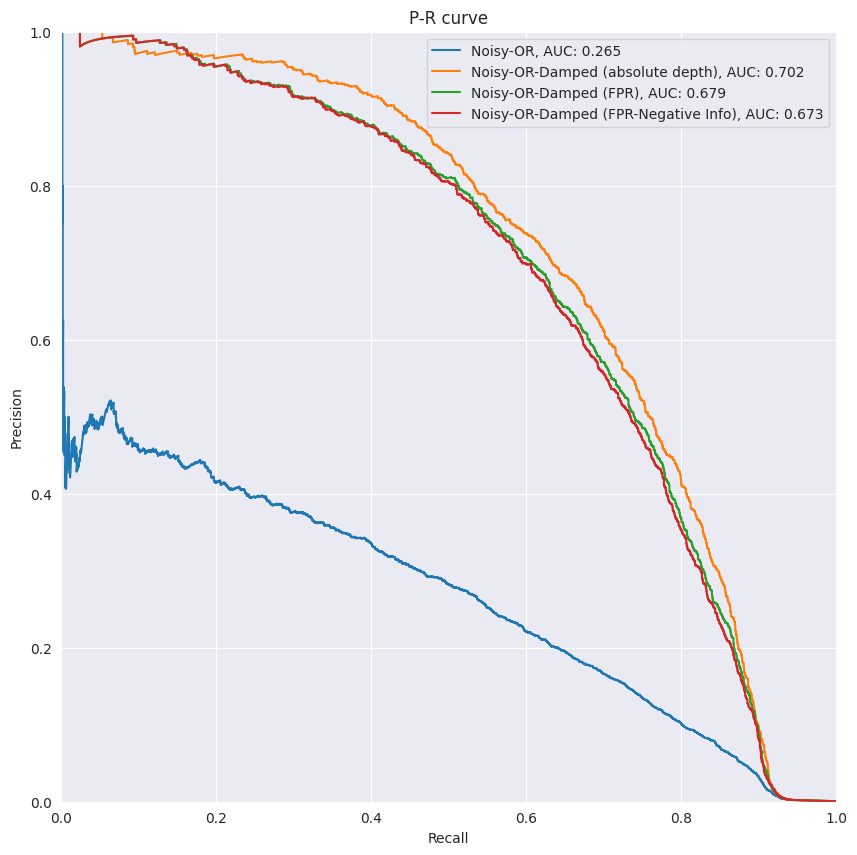

In [279]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.003

selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = -(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None))
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))
selected_df["pm6a_diff"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])) + (selected_df["logsum_pca"]/(1+selected_df["count"]*(1-selected_df["dom"])))

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["logsum_pm6a"] * -1)
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_abs"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (absolute depth), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_diff"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR-Damped (FPR-Negative Info), AUC: {auc_score:.3f}")



ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
plt.show()
plt.close()


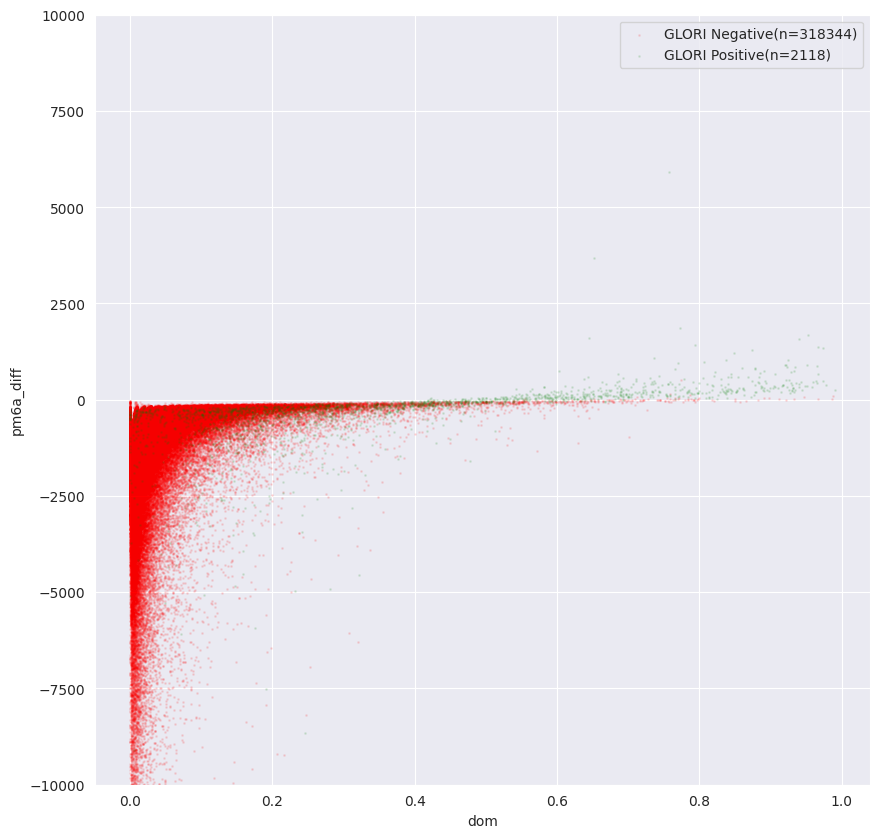

In [268]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"] + selected_df["logsum_pca"]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff") 
ax.set_ylim(-10000,10000)
plt.show()
plt.close() 

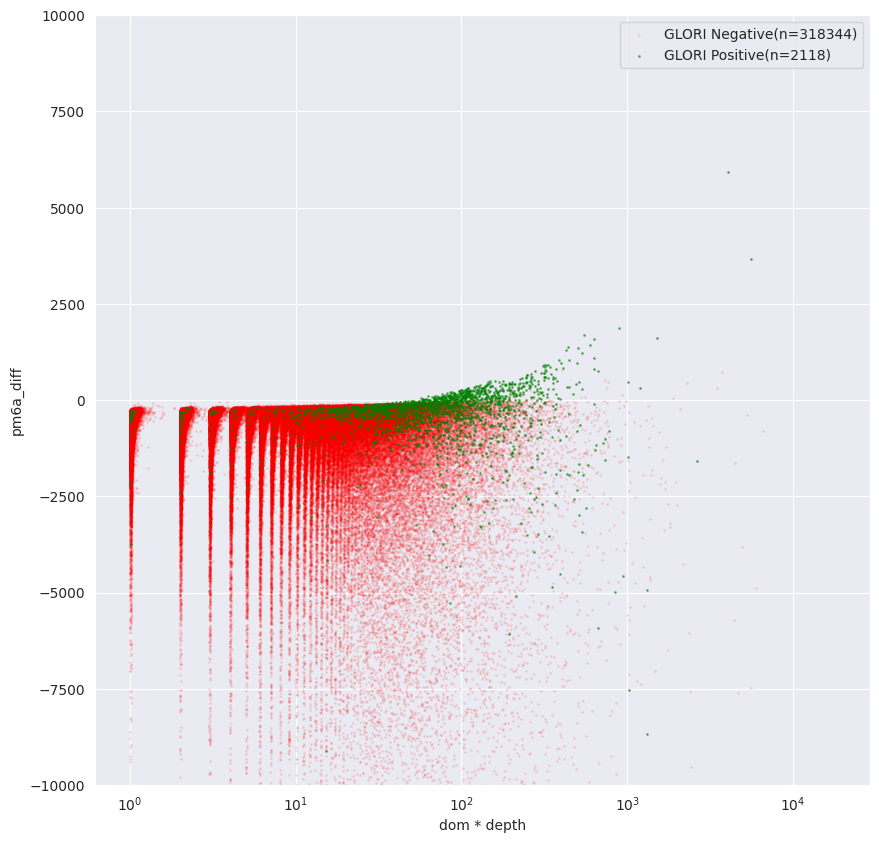

In [285]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"] + selected_df["logsum_pca"]

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count"]*neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count"]*pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom * depth")
ax.set_ylabel("pm6a_diff")
ax.set_xscale("log")
ax.set_ylim(-10000,10000)
plt.show()
plt.close()

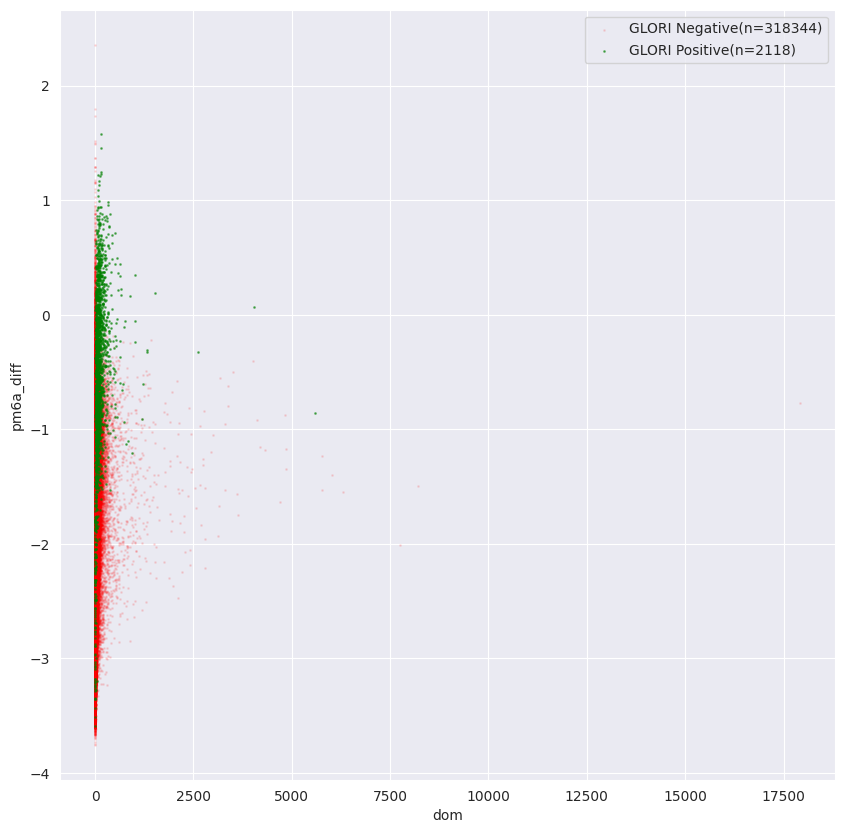

In [282]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -(selected_df["logsum_pm6a"]/(selected_df["count"]*selected_df["dom"])) + (selected_df["logsum_pca"]/(selected_df["count"]*(1-selected_df["dom"])))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

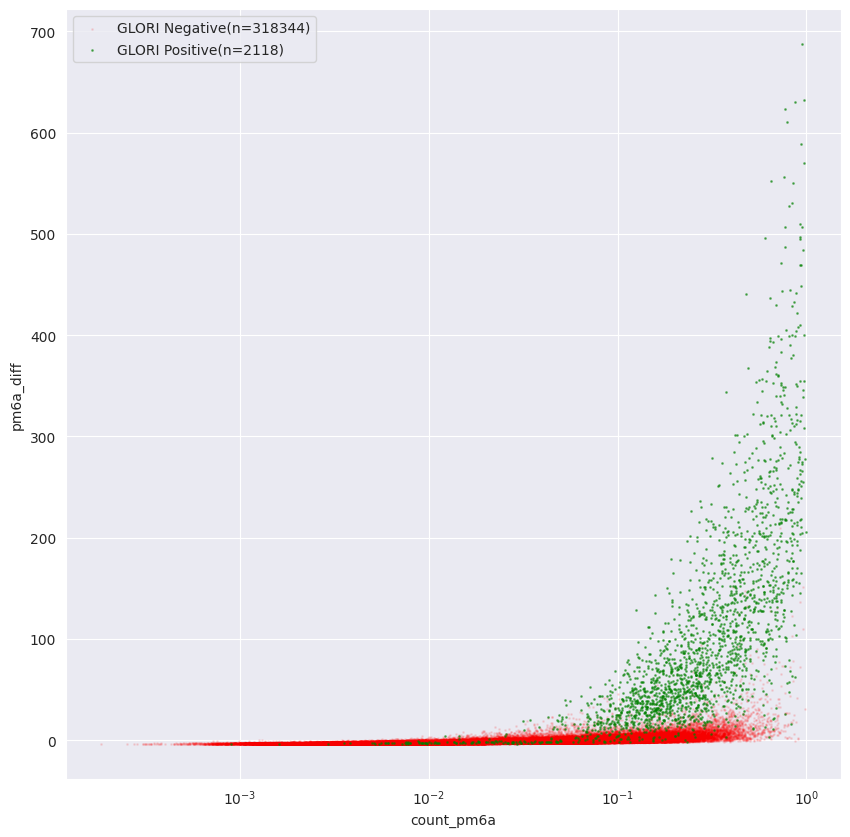

In [278]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"])) + (selected_df["logsum_pca"]/(1+selected_df["count"]*(1-selected_df["dom"])))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("count_pm6a")
ax.set_xscale("log")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close()

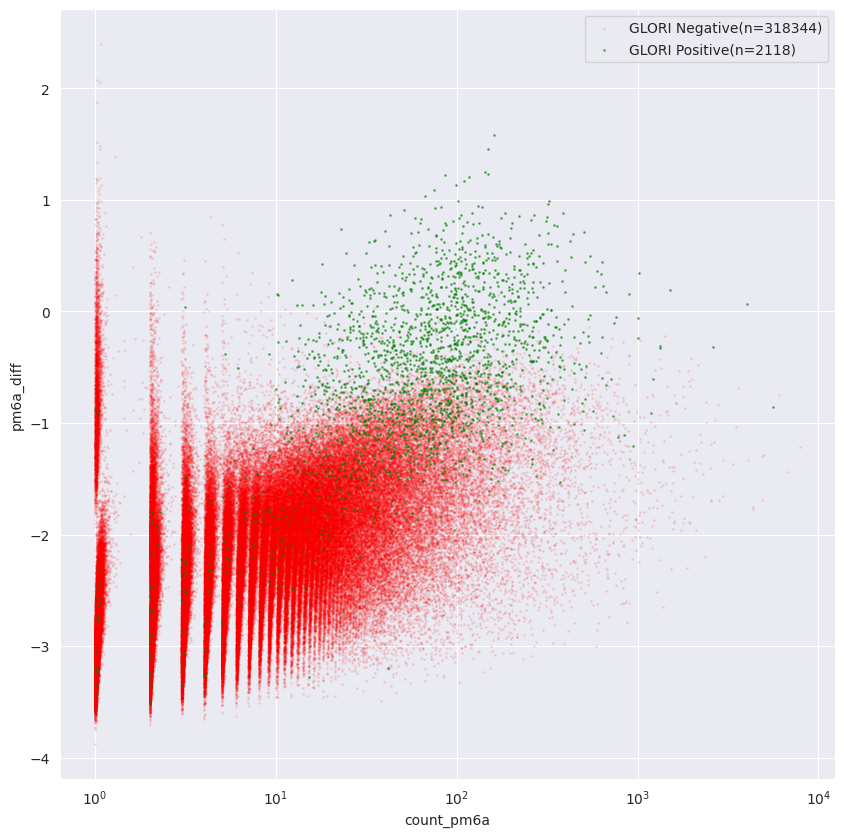

In [281]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -(selected_df["logsum_pm6a"]/(selected_df["count"]*selected_df["dom"])) + (selected_df["logsum_pca"]/(selected_df["count"]*(1-selected_df["dom"])))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count"]*neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count"]*pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("count_pm6a")
ax.set_xscale("log")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close()

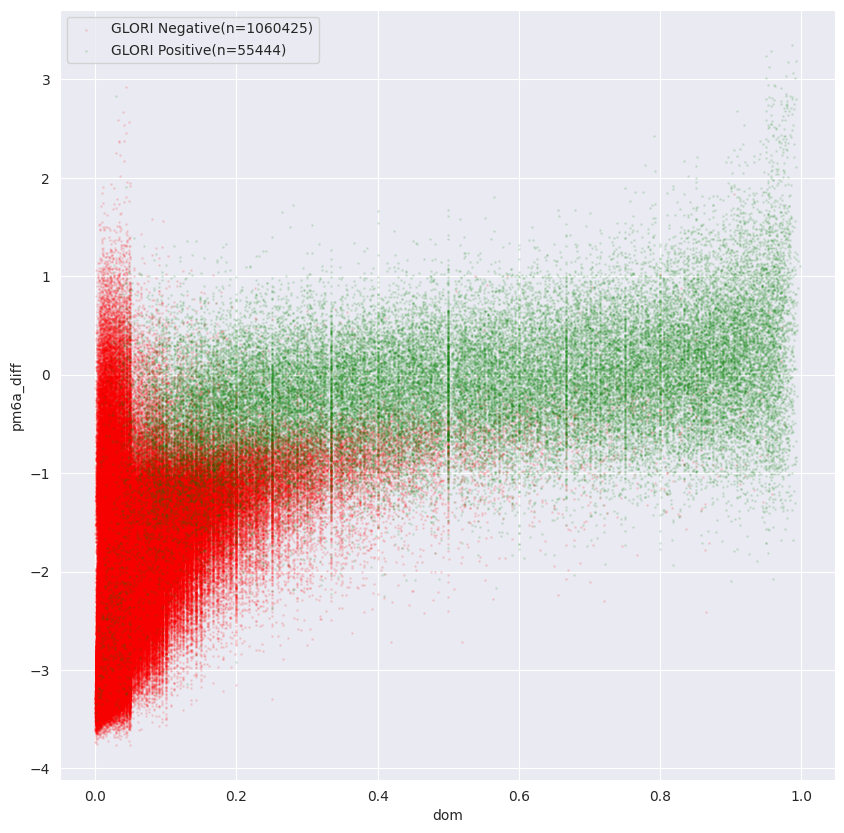

In [272]:
fpr = 0.0027
selected_df = pca_df[(pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -(selected_df["logsum_pm6a"]/(selected_df["count"]*selected_df["dom"])) + (selected_df["logsum_pca"]/(selected_df["count"]*(1-selected_df["dom"])))

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

In [280]:
cell_df = "/extdata4/baeklab/Hyeonseo/m6A/inference/inference/AIRNA-DW-v4-20240905-092858-10-177000-token_normalise_dwell_bq_npz_allmotif_pileup/pileup.pkl"
cell_df = pd.read_pickle(cell_df)
cell_df = cell_df[cell_df["count_pm6a"] >= 20]
cell_label_df = cell_df.merge(label_df_filtered, on="label_id", how="inner")
cell_label_df["threshold"] = 1-((0.9 ** (1-cell_label_df["dom"])) * (0.02 ** (cell_label_df["dom"])))
cell_label_df["discarded_ratio"] = (cell_label_df["count_dom"] - cell_label_df["count_pm6a"]) / cell_label_df["count_dom"]


/home/sonic/baeklab/Junhak/anaconda3/envs/Hyeonseo_torch/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


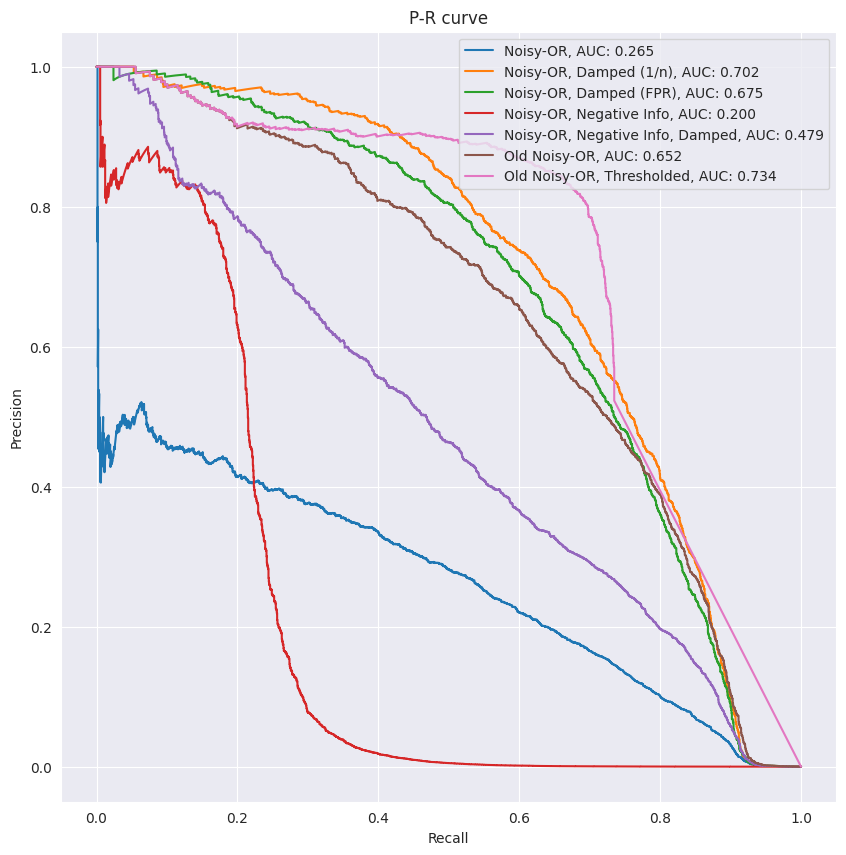

In [308]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.0027

selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = -(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None))
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))
selected_df["pm6a_damp_fpr_thr"] = selected_df["pm6a_damp_fpr"] * (selected_df["count"] < 2000)
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"] + selected_df["logsum_pca"]
selected_df["pm6a_diff_damp"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

fig, ax = plt.subplots(1, 1, figsize=(10, 10))

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["logsum_pm6a"] * -1)
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_abs"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, Damped (1/n), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_damp_fpr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, Damped (FPR), AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_diff"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, Negative Info, AUC: {auc_score:.3f}")

precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_diff_damp"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, Negative Info, Damped, AUC: {auc_score:.3f}")

selected_df = cell_label_df[(~cell_label_df["drach"]) & (cell_label_df["count_pm6a"] >= 100) & (cell_label_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_thr"] = selected_df["pm6a"] * (selected_df["pm6a"] > selected_df["threshold"])


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Old Noisy-OR, AUC: {auc_score:.3f}")


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_thr"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Old Noisy-OR, Thresholded, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


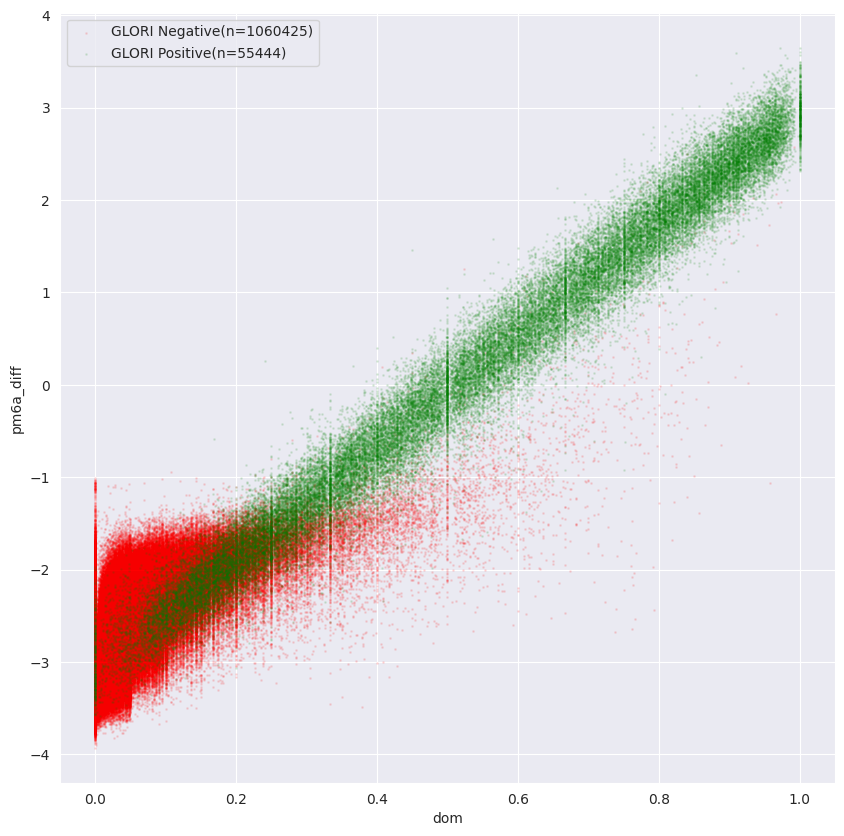

In [293]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.1, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

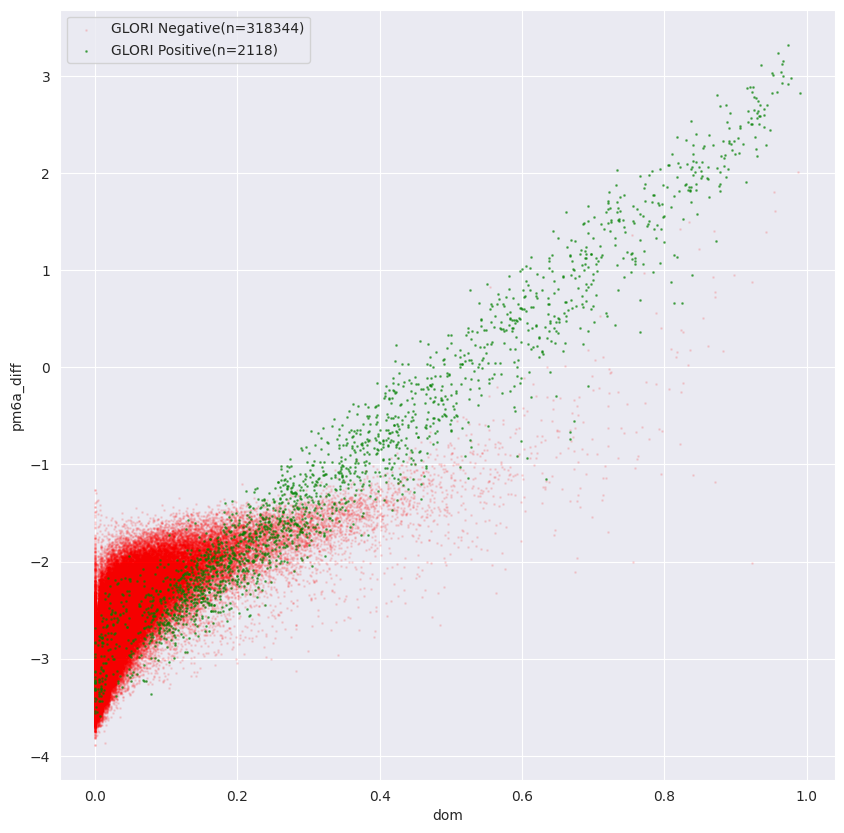

In [295]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

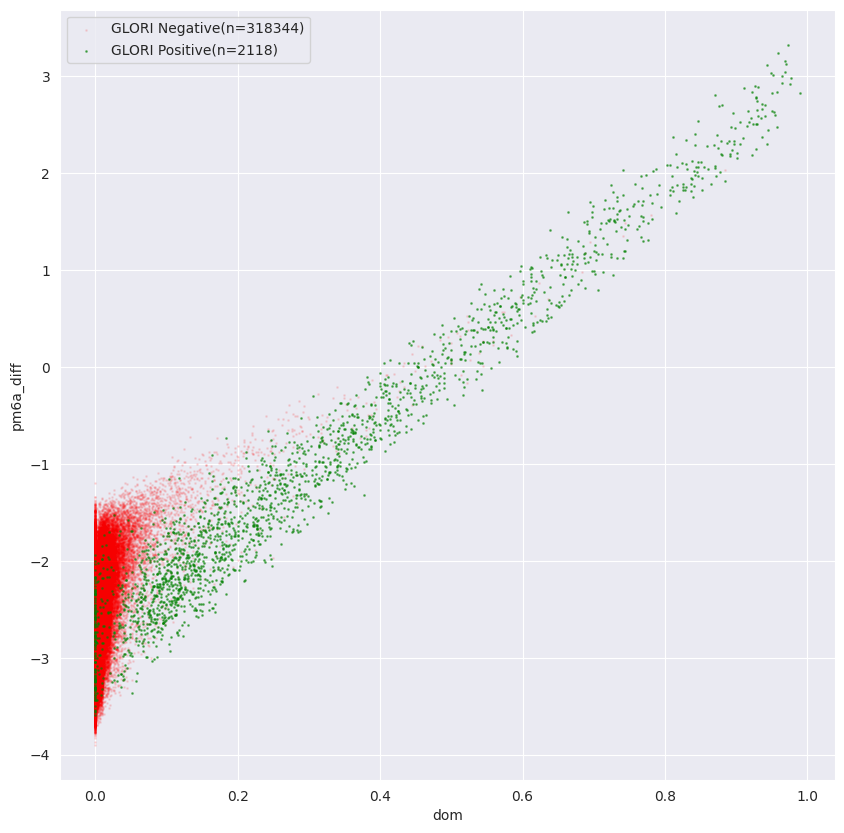

In [296]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])

neg_df = selected_df[selected_df["dom_label"] == 0].sample(frac=0.1)
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

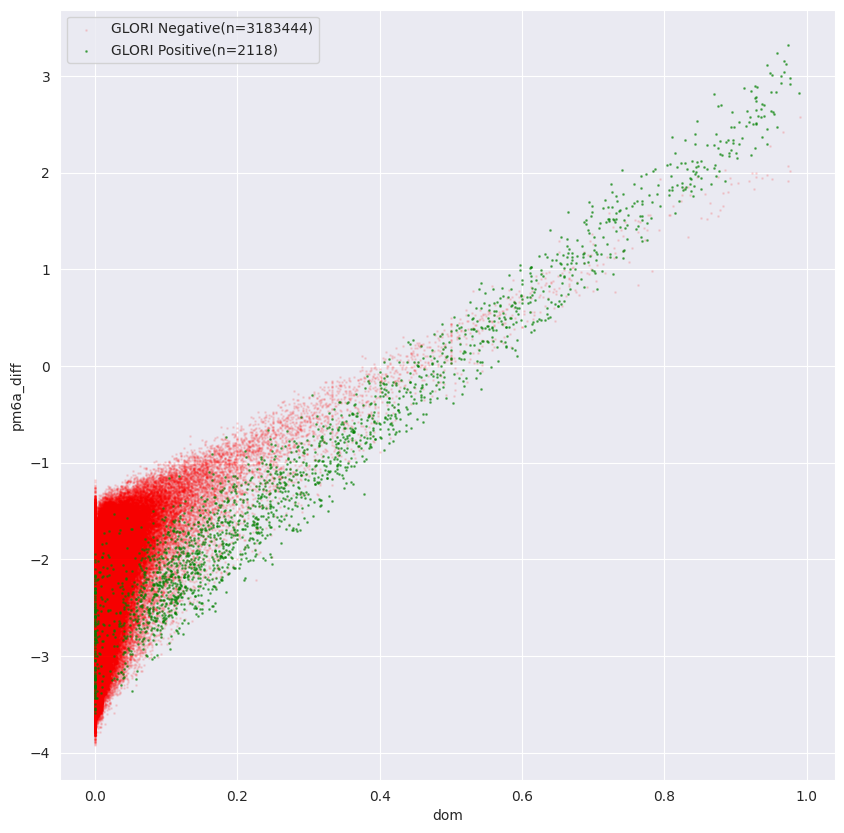

In [297]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

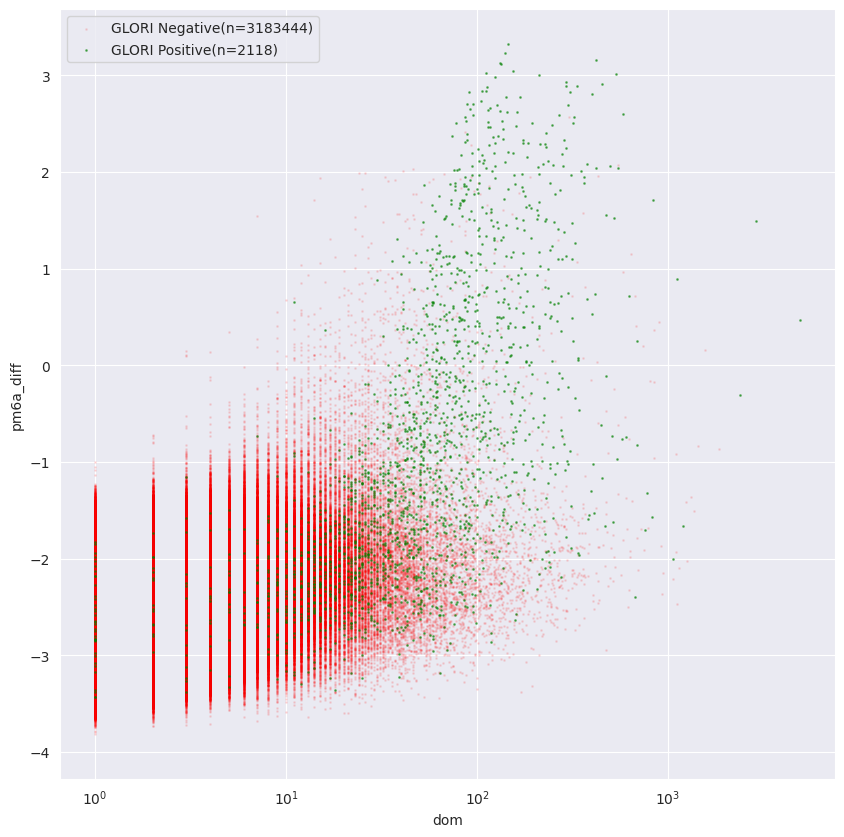

In [299]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
ax.set_xscale("log")
plt.show()
plt.close() 

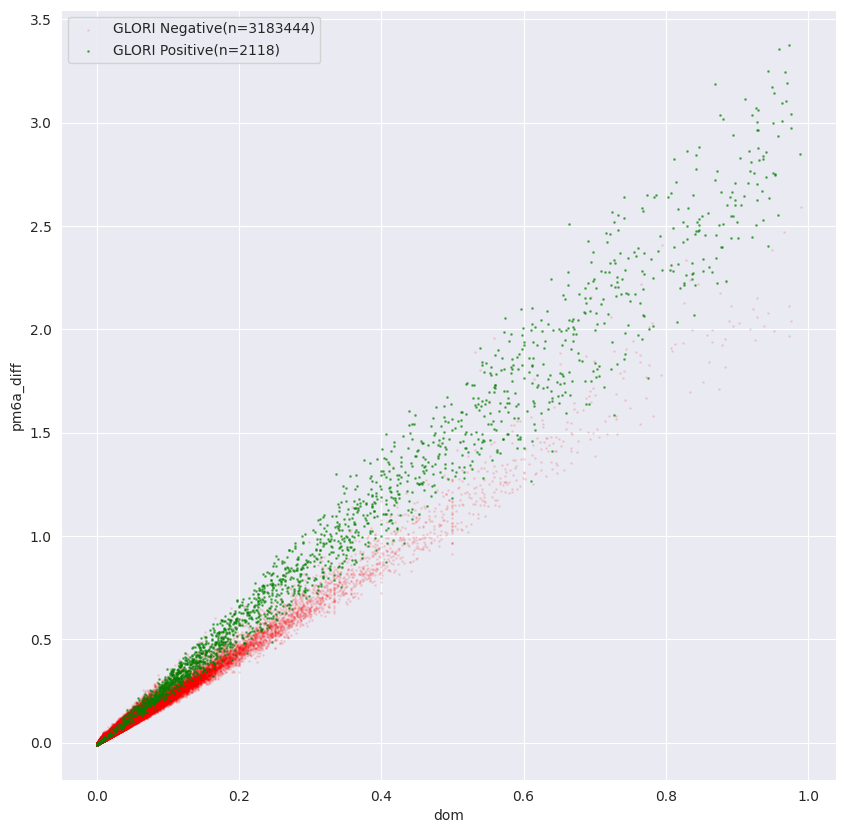

In [305]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

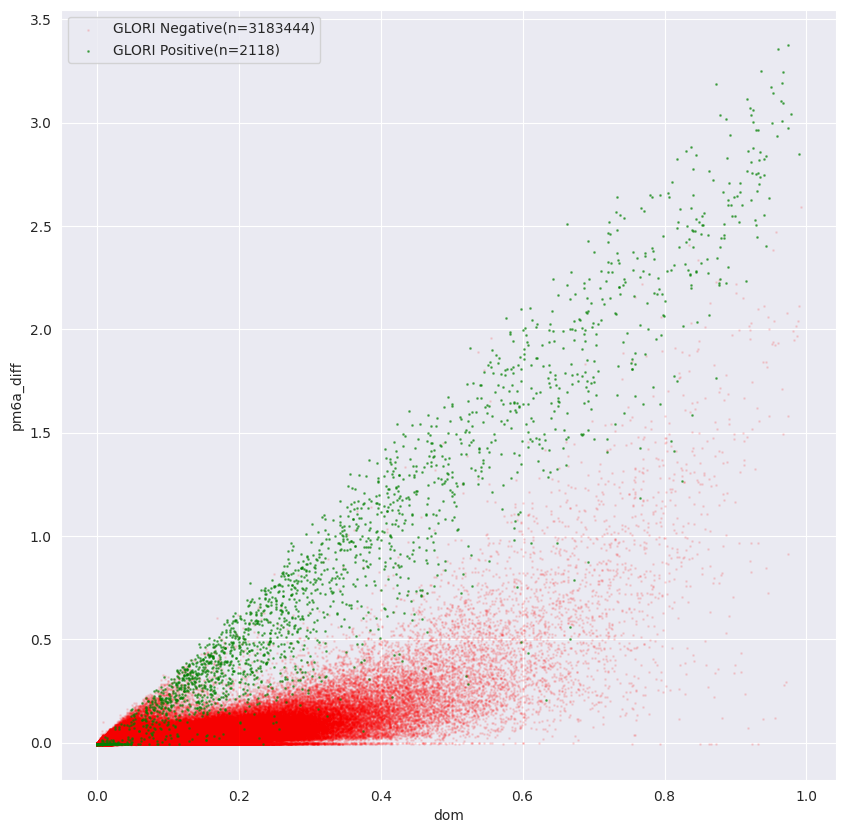

In [303]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["dom"], neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["dom"], pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

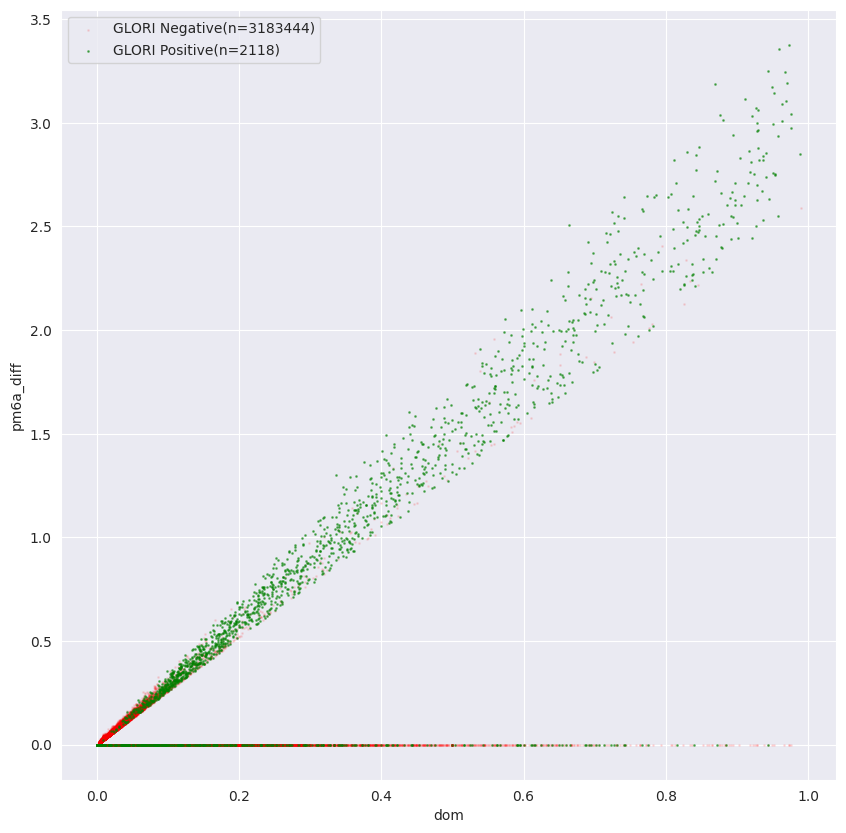

In [306]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

selected_df["threshold"] = -np.log10(fpr) * selected_df["count_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"])
selected_df["pm6a_diff"] = selected_df["pm6a_diff"] * (selected_df["pm6a_diff"] > selected_df["threshold"])

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

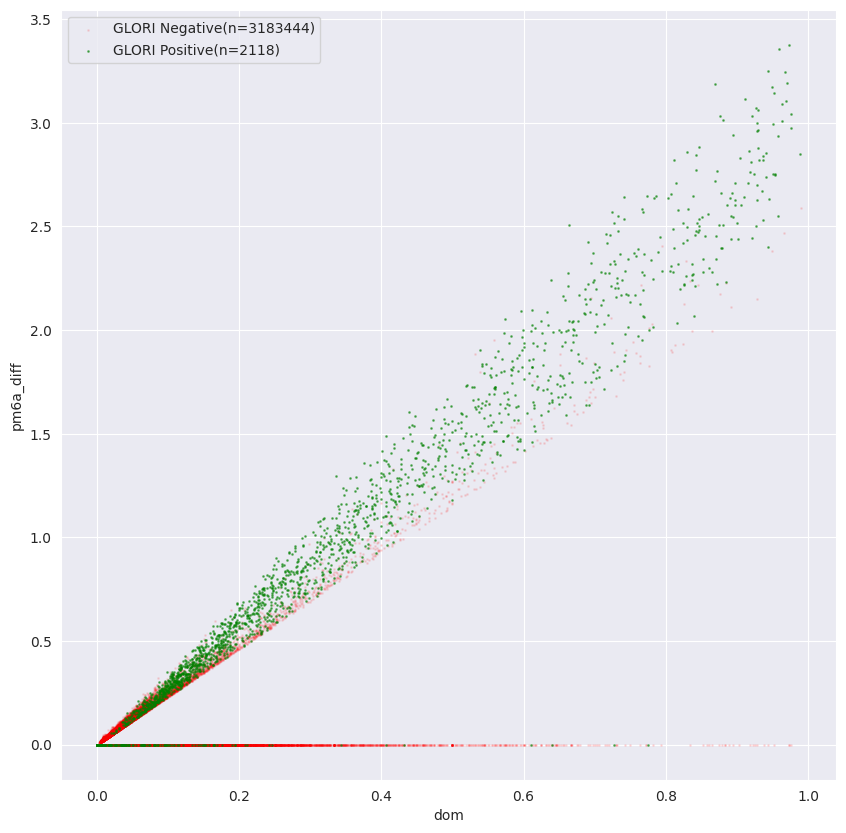

In [307]:
fpr = 0.005
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

selected_df["threshold"] = -np.log10(fpr) * selected_df["count_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"])
selected_df["pm6a_diff"] = selected_df["pm6a_diff"] * (selected_df["pm6a_diff"] > selected_df["threshold"])

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

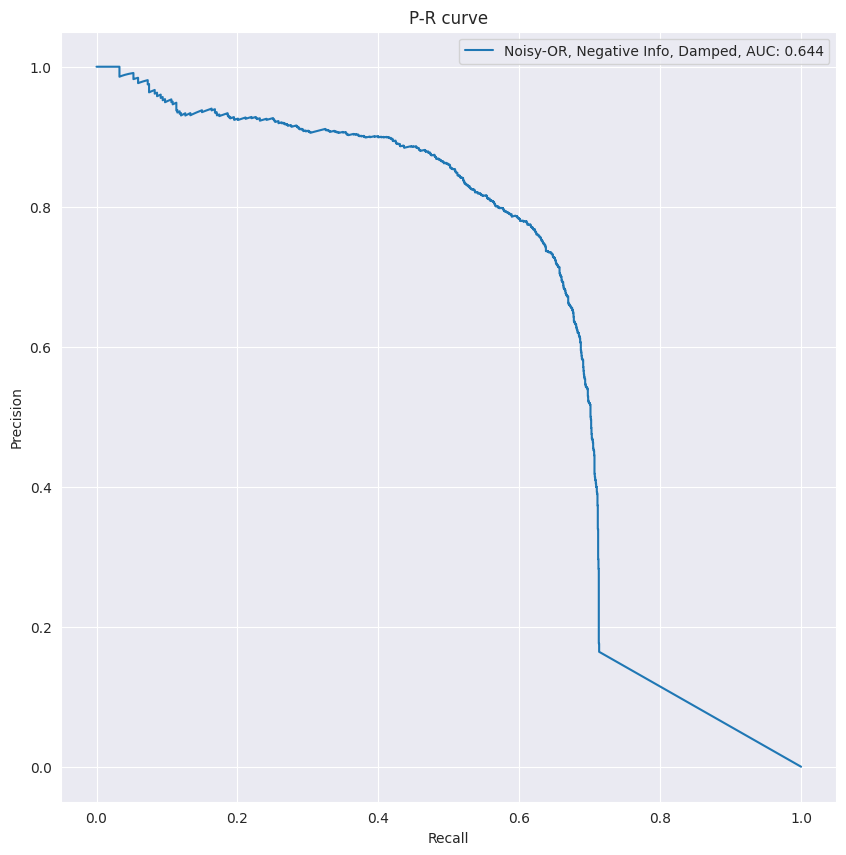

In [333]:
from sklearn.metrics import precision_recall_curve, auc

fpr = 0.0027

selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_damp_abs"] = -(selected_df["logsum_pm6a"]/np.clip(selected_df["count"],1,None))
selected_df["pm6a_damp_fpr"] = -(selected_df["logsum_pm6a"]/(1+fpr*selected_df["count"]))
selected_df["pm6a_damp_fpr_thr"] = selected_df["pm6a_damp_fpr"] * (selected_df["count"] < 2000)
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"] + selected_df["logsum_pca"]
selected_df["pm6a_diff_damp"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr
selected_df["threshold"] = -np.log10(fpr) * selected_df["count_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"])
selected_df["pm6a_diff_damp"] = selected_df["pm6a_diff_damp"] * ((selected_df["pm6a_diff_damp"] > selected_df["threshold"]) & (selected_df["dom"] > 0.05))


fig, ax = plt.subplots(1, 1, figsize=(10, 10))


precision, recall, _ = precision_recall_curve(selected_df["label"], selected_df["pm6a_diff_damp"])
auc_score = auc(recall, precision)
ax.plot(recall, precision, label=f"Noisy-OR, Negative Info, Damped, AUC: {auc_score:.3f}")


ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("P-R curve")
ax.legend()
plt.show()
plt.close()


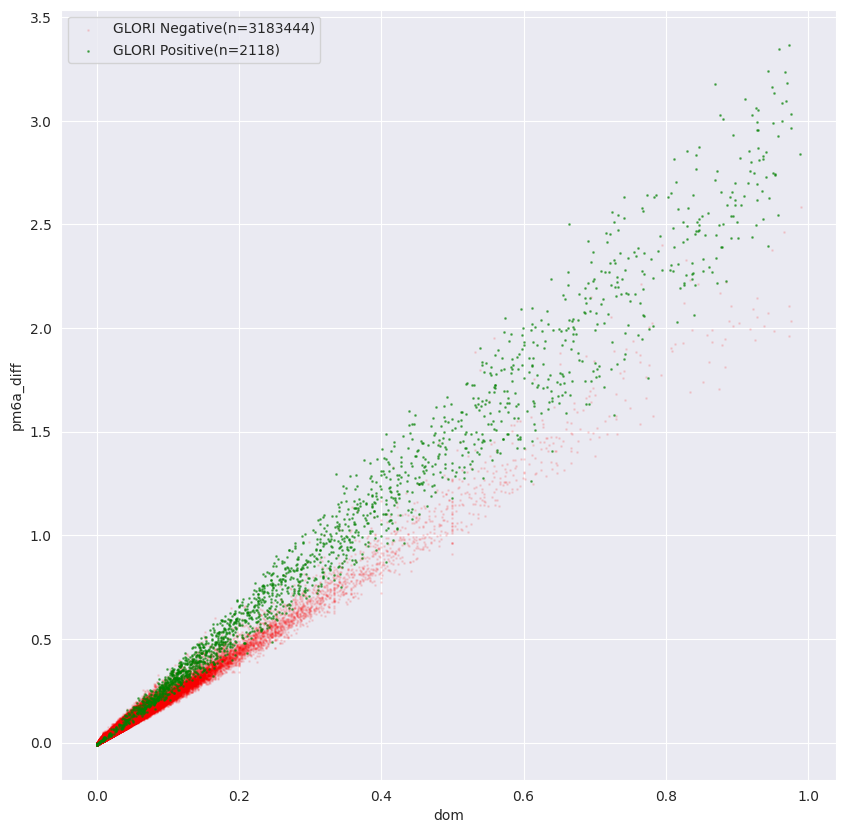

In [317]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

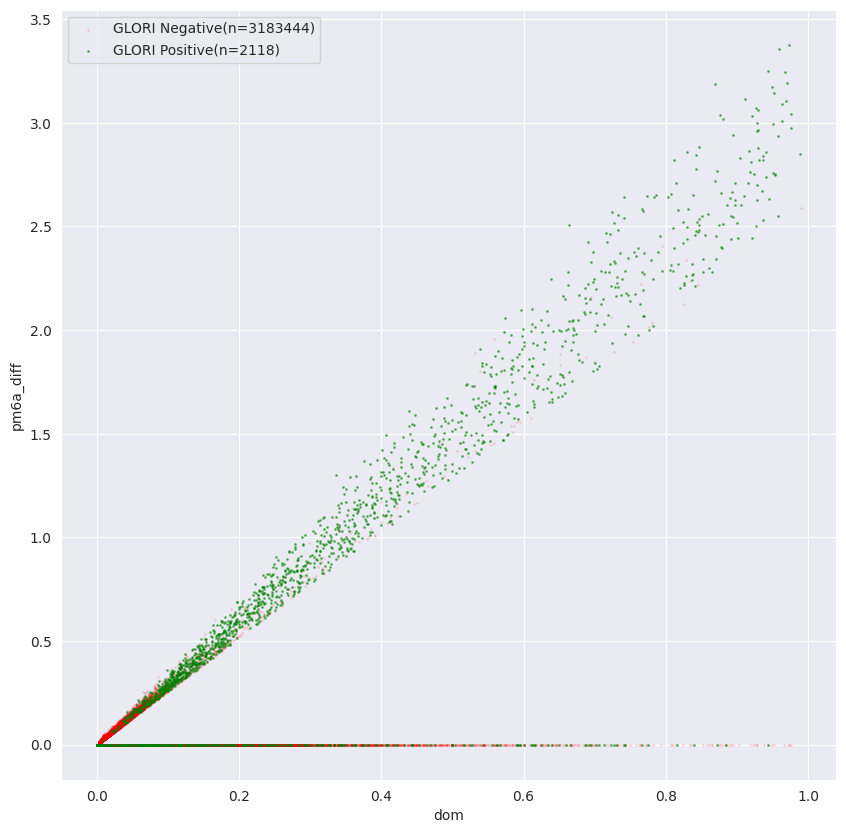

In [312]:

fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr*(1-(selected_df["count_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"])))


selected_df["threshold"] = -np.log10(fpr) * selected_df["count_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"])
selected_df["pm6a_diff"] = selected_df["pm6a_diff"] * (selected_df["pm6a_diff"] > selected_df["threshold"])

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

(array([2.3146758 , 0.2788766 , 0.47409022, 0.40437107, 0.69719151,
        0.75296683, 1.1573379 , 0.85057364, 0.94818045, 1.10156258,
        1.08761875, 0.99001194, 0.69719151, 0.69719151, 0.75296683,
        0.47409022, 0.55775321, 0.66930385, 0.57169704, 0.4183149 ,
        0.43225873, 0.44620256, 0.58564087, 0.40437107, 0.40437107,
        0.46014639, 0.37648341, 0.33465192, 0.37648341, 0.36253958,
        0.30676426, 0.25098894, 0.36253958, 0.23704511, 0.29282043,
        0.23704511, 0.22310128, 0.23704511, 0.32070809, 0.25098894,
        0.23704511, 0.23704511, 0.22310128, 0.32070809, 0.23704511,
        0.15338213, 0.16732596, 0.19521362, 0.29282043, 0.16732596,
        0.12549447, 0.23704511, 0.18126979, 0.20915745, 0.16732596,
        0.15338213, 0.06971915, 0.15338213, 0.08366298, 0.22310128,
        0.15338213, 0.11155064, 0.05577532, 0.09760681, 0.09760681,
        0.18126979, 0.12549447, 0.20915745, 0.09760681, 0.08366298,
        0.08366298, 0.09760681, 0.11155064, 0.09

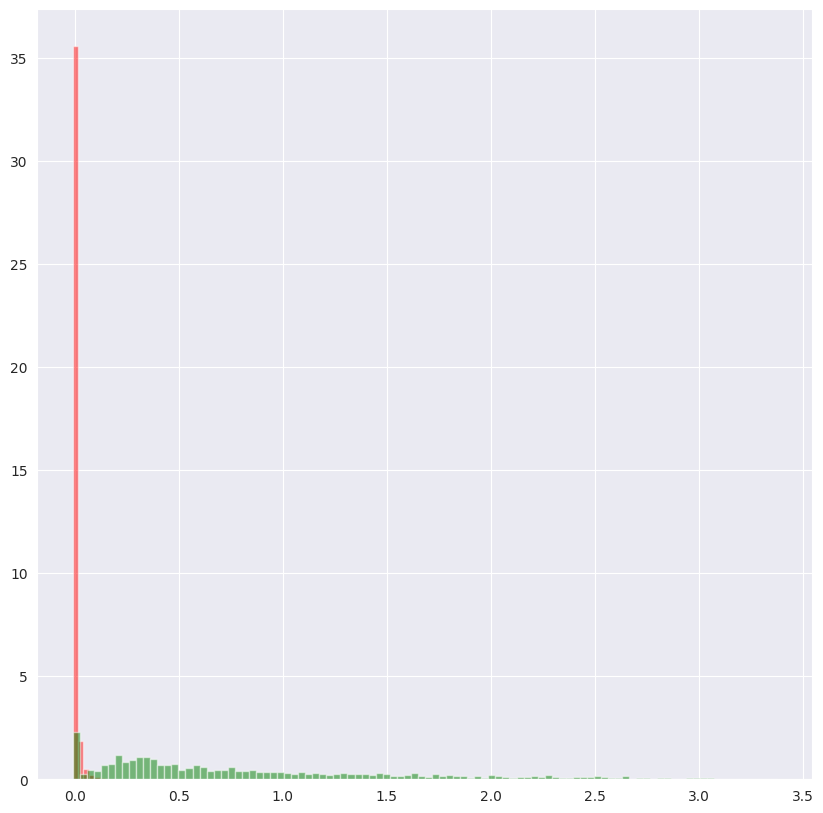

In [322]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.hist(neg_df["pm6a_diff"], bins=100, alpha=0.5, color="red", label=f"GLORI Negative(n={len(neg_df)})", density=True)
ax.hist(pos_df["pm6a_diff"], bins=100, alpha=0.5, color="green", label=f"GLORI Positive(n={len(pos_df)})", density=True)

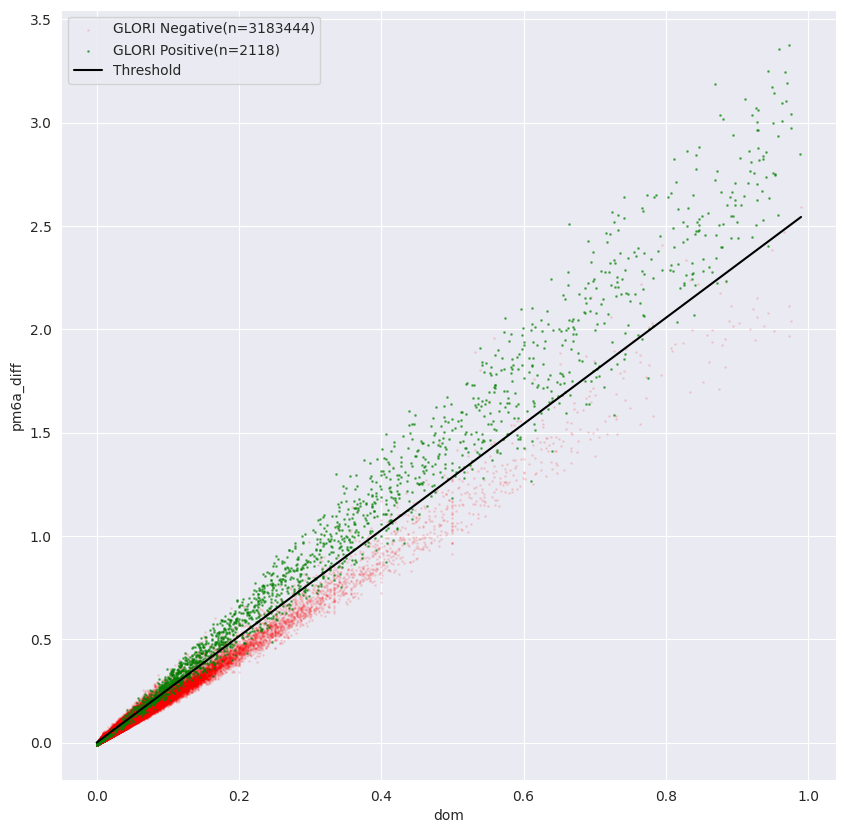

In [328]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

x = np.arange(0,1,0.01)
y = -np.log10(fpr) * x

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.plot(x, y, color="black", label="Threshold")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 

In [ ]:
fpr = 0.0027
selected_df = pca_df[(~pca_df["drach"]) & (pca_df["count_dom"] >= 100) & (pca_df["label"] >= 0)]
selected_df = selected_df[(selected_df["label"] == 0)|(selected_df["dom_label"] > 0.1)]
selected_df["pm6a_diff"] = -selected_df["logsum_pm6a"]/(selected_df["count_pm6a"]+selected_df["count_pca"]) + selected_df["logsum_pca"]/(selected_df["count_pm6a"]+selected_df["count_pca"])*fpr

neg_df = selected_df[selected_df["dom_label"] == 0]
pos_df = selected_df[selected_df["dom_label"] > 0]

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(neg_df["count_pm6a"]/(neg_df["count_pm6a"]+neg_df["count_pca"]), neg_df["pm6a_diff"], alpha=0.1, s = 1, color="red", label=f"GLORI Negative(n={len(neg_df)})")
ax.scatter(pos_df["count_pm6a"]/(pos_df["count_pm6a"]+pos_df["count_pca"]), pos_df["pm6a_diff"], alpha=0.5, s = 1, color="green", label=f"GLORI Positive(n={len(pos_df)})")
ax.legend()
ax.set_xlabel("dom")
ax.set_ylabel("pm6a_diff")
plt.show()
plt.close() 